In [1]:
import os
import csv

import torch
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torch.autograd import Variable
from torch.nn.utils import clip_grad_norm_
from torch.amp import autocast, GradScaler

import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau, LambdaLR
from torchsummary import summary

from lightning import Fabric


# Set environment variables for PyTorch
os.environ["CUDA_VISIBLE_DEVICES"] = "0"  # Specify which GPU to use, if needed

# PyTorch does not have direct equivalents for some TensorFlow environment settings,
# but you can manage GPU memory growth and logging through PyTorch"s API.

# Disable debug information (PyTorch does not have a direct equivalent, but you can manage logging)
# PyTorch logging can be managed through Python"s logging module or by setting verbosity levels.

# Check if CUDA is available and set device
fabric = Fabric(accelerator="cuda", devices=1, precision="bf16-true")
fabric.launch()

torch.set_float32_matmul_precision('high')

# Print PyTorch version
print(torch.__version__)

# Print number of available GPUs
print("Num GPUs Available: ", torch.cuda.device_count())

# List local devices (PyTorch does not have a direct equivalent, but you can check CUDA devices)
for i in range(torch.cuda.device_count()):
    print(f"Device {i}: {torch.cuda.get_device_name(i)}")

You are using a CUDA device ('NVIDIA GeForce RTX 4090') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


2.5.1
Num GPUs Available:  1
Device 0: NVIDIA GeForce RTX 4090


In [2]:
import time
import cv2
import random
import glob
import math

from tqdm import tqdm

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from models_torch.segformer_3d import SegFormer3D_SHViT as SegFormer

In [6]:
EPOCHS = [20,2000]

LEARNING_RATE = 1e-4
N_CONVS = 2
N_STAGES = 3
BATCH_SIZE = 1
ACCUMULATION_STEPS = 5

USE_CENTER_ATT = True
USE_RESIZE = False

MODEL = "B5"
SHVIT_TYPE = "S2"
DATA_NAME = f"SegFormer_{N_CONVS}conv"
DEPTH, HEIGHT, WIDTH = 224, 224, 224
DIM = f"{DATA_NAME}_{DEPTH}x{HEIGHT}x{WIDTH}"
MODEL_NAME = f"{MODEL}_{SHVIT_TYPE}_sw_{DIM}"

# file_path = "/mnt/c/Users/ChangGeng/Desktop/Projekte/Bachelorarbeit/SHVIT_SegFormer_BA/Datasets/shoes/images_3d/images_3d_SegFormer_2conv_224x224x224/volumes/Bruschi_down2_2_2.npy"
train_folder = f"/mnt/c/Users/ChangGeng/Desktop/Projekte/Bachelorarbeit/SHVIT_SegFormer_BA/Datasets/shoes/images_3d/images_3d_{DIM}/"
valid_folder = f"/mnt/c/Users/ChangGeng/Desktop/Projekte/Bachelorarbeit/SHVIT_SegFormer_BA/Datasets/shoes/images_3d/images_3d_{DIM}/"
# train_folder = f"/mnt/d/Datasets/shoes/images_3d/images_3d_{DIM}/"
# valid_folder = f"/mnt/d/Datasets/shoes/images_3d/images_3d_{DIM}/"


class_dict = {"Background": 0, "Karton": 1, "Außensohle": 2, "Innensohle": 3, "Obermaterial": 4, "Zunge": 5, "Füllmaterial": 6}
N_CLASSES = len(class_dict)

In [7]:
# due to the different naming of the shoes (images and masks) we have to create a dict to map the images to an unique id

shoe_img_dict = {"Adidas_Martin-weiss": 1, "Adidas_Martin": 2, 
                 "Bruschi_down2_2_2": 3, "Camper_down2_2_2": 4, 
                 "Citywalk-sit-taupe-34_down2_2_2": 5, "Citywalk-sit-taupe-36_down2_2_2": 6, 
                 "Citywalk-sit-taupe-39_down2_2_2": 7, "Citywalk-sit-taupe-40_down2_2_2": 8, 
                 "Citywalk-sit-taupe-42_down2_2_2": 9, "Herrenschuh_43p5_down2_2_2": 10, 
                 "Lidl_43_down2_2_2": 11, "Lloyd_38_down2_2_2": 12, 
                 "Lloyd_pink_down2_2_2": 13, "Lloyd_weiss_down2_2_2": 14, 
                 "McKinley_Anton_down2_2_2": 15, "Mustang-Sch-Navy-Metalli-35_down2_2_2": 16, 
                 "Mustang-Sch-Navy-Metalli-40_down2_2_2": 17, "Mustang-Sch-Navy-Metalli_31_down2_2_2": 18, 
                 "Mustang-Sch-Navy-Metalli_36_down2_2_2": 19, "Mustang-Sch-Navy-Metalli_37_down2_2_2": 20, 
                 "Pertolio-dunkelbraun_43_down2_2_2": 21, "Petrolio-Sch-dunkelbraun_42_down2_2_2": 22, 
                 "Petrolio-Sch-dunkelbraun_44_down2_2_2": 23, "Petrolio-Sch-dunkelbraun_46_down2_2_2": 24,
                 "PetrolioSch-40-float_down2_2_2": 25, "Puma_38_down2_2_2": 26, 
                 "Puma_Silver_down2_2_2": 27, "Puma_White_down2_2_2": 28, 
                 "Schuh_Martin_down2_2_2": 29, "Shoepassion_40_down2_2_2": 30, 
                 "Shoepassion_45_down2_2_2": 31, "Shoepassion_Herren_40_down2_2_2": 32, 
                 "Sneaker_Dana_Nike": 33, "Sneaker_Dana_Puma_Flyer": 34, 
                 "Stiefel-XY_40_down2_2_2": 35, "Tamaris-Pump-Schwarz-38_down2_2_2": 36, 
                 "Tamaris-Pump-schwarz_36_down2_2_2": 37, "Tamaris-Pump-Schwarz_39_down2_2_2": 38, 
                 "Tamaris-Pump-schwarz_40_down2_2_2": 39, "Tamaris-Pump-schwarz_42_down2_2_2": 40}

shoe_mask_dict = {"Adidas_Martin-weiss": 1, "Adidas_Martin": 2, 
                  "Bruschi_down2_2_2": 3, "Camper_down2_2_2": 4, 
                  "Citywalk 34": 5, "Citywalk 36": 6, 
                  "Citywalk 39": 7, "Citywalk 40": 8, 
                  "Citywalk 42": 9, "Herrenschuh_43p5_down2_2_2": 10, 
                  "Lidl_43_down2_2_2": 11, "Lloyd_38_down2_2_2": 12, 
                  "Lloyd_pink_down2_2_2": 13, "Lloyd_weiss_down2_2_2": 14, 
                  "McKinley_Anton": 15, "Mustang 35": 16, 
                  "Mustang 40": 17, "Mustang 31": 18, 
                  "Mustang 36": 19, "Mustang 37": 20, 
                  "Petrolio 43": 21, "Petrolio 42": 22, 
                  "Petrolio 44": 23, "Petrolio 46": 24, 
                  "Petrolio 40": 25, "Puma_38_down2_2_2": 26, 
                  "Puma_Silver_down2_2_2": 27, "Puma_White_down2_2_2": 28, 
                  "Schuh_Martin_down2_2_2": 29, "Shoepassion_40_down2_2_2": 30, 
                  "Shoepassion_45_down2_2_2": 31, "Shoepassion_Herren_40_down2_2_2": 32, 
                  "Sneaker_Dana_Nike": 33, "Sneaker_Dana_Puma_Flyer": 34, 
                  "StiefelXY": 35, "TamarisPump 38": 36,
                  "TamarisPump 36": 37, "TamarisPump 39": 38, 
                  "TamarisPump 40": 39, "TamarisPump 42": 40}

In [8]:
filenames = glob.glob(os.path.join(train_folder, "volumes/*.npy"))
filenames

['/mnt/c/Users/ChangGeng/Desktop/Projekte/Bachelorarbeit/SHVIT_SegFormer_BA/Datasets/shoes/images_3d/images_3d_SegFormer_2conv_224x224x224/volumes/Adidas_Martin-weiss.npy',
 '/mnt/c/Users/ChangGeng/Desktop/Projekte/Bachelorarbeit/SHVIT_SegFormer_BA/Datasets/shoes/images_3d/images_3d_SegFormer_2conv_224x224x224/volumes/Adidas_Martin.npy',
 '/mnt/c/Users/ChangGeng/Desktop/Projekte/Bachelorarbeit/SHVIT_SegFormer_BA/Datasets/shoes/images_3d/images_3d_SegFormer_2conv_224x224x224/volumes/Bruschi_down2_2_2.npy',
 '/mnt/c/Users/ChangGeng/Desktop/Projekte/Bachelorarbeit/SHVIT_SegFormer_BA/Datasets/shoes/images_3d/images_3d_SegFormer_2conv_224x224x224/volumes/Camper_down2_2_2.npy',
 '/mnt/c/Users/ChangGeng/Desktop/Projekte/Bachelorarbeit/SHVIT_SegFormer_BA/Datasets/shoes/images_3d/images_3d_SegFormer_2conv_224x224x224/volumes/Citywalk-sit-taupe-34_down2_2_2.npy',
 '/mnt/c/Users/ChangGeng/Desktop/Projekte/Bachelorarbeit/SHVIT_SegFormer_BA/Datasets/shoes/images_3d/images_3d_SegFormer_2conv_224x224

In [9]:
# Extracting the filenames
extracted_filenames = [os.path.basename(filename) for filename in filenames]
print(extracted_filenames)
print(len(extracted_filenames))

['Adidas_Martin-weiss.npy', 'Adidas_Martin.npy', 'Bruschi_down2_2_2.npy', 'Camper_down2_2_2.npy', 'Citywalk-sit-taupe-34_down2_2_2.npy', 'Citywalk-sit-taupe-36_down2_2_2.npy', 'Citywalk-sit-taupe-39_down2_2_2.npy', 'Citywalk-sit-taupe-40_down2_2_2.npy', 'Citywalk-sit-taupe-42_down2_2_2.npy', 'Herrenschuh_43p5_down2_2_2.npy', 'Lidl_43_down2_2_2.npy', 'Lloyd_38_down2_2_2.npy', 'Lloyd_pink_down2_2_2.npy', 'Lloyd_weiss_down2_2_2.npy', 'McKinley_Anton_down2_2_2.npy', 'Mustang-Sch-Navy-Metalli-35_down2_2_2.npy', 'Mustang-Sch-Navy-Metalli-40_down2_2_2.npy', 'Mustang-Sch-Navy-Metalli_31_down2_2_2.npy', 'Mustang-Sch-Navy-Metalli_36_down2_2_2.npy', 'Mustang-Sch-Navy-Metalli_37_down2_2_2.npy', 'Pertolio-dunkelbraun_43_down2_2_2.npy', 'Petrolio-Sch-dunkelbraun_42_down2_2_2.npy', 'Petrolio-Sch-dunkelbraun_44_down2_2_2.npy', 'Petrolio-Sch-dunkelbraun_46_down2_2_2.npy', 'PetrolioSch-40-float_down2_2_2.npy', 'Puma_38_down2_2_2.npy', 'Puma_Silver_down2_2_2.npy', 'Puma_White_down2_2_2.npy', 'Schuh_Marti

In [10]:
class DataGenerator(Dataset):
    def __init__(self, filenames=None, folder_path=None, augment=False, **kwargs):
        super(DataGenerator, self).__init__(**kwargs)
        self.filenames = filenames
        self.folder_path = folder_path
        self.datalen = len(self.filenames)
        self.indexes = np.arange(self.datalen)
        self.augment = augment
        
        
    def loadData(self, file):
        folder = self.folder_path
        
        filename_segs = None
        fn = os.path.join(folder, f"volumes/{file}")
            
        key = os.path.splitext(file)[0]
        if key in shoe_img_dict:
            id = shoe_img_dict[key]
            for key, value in shoe_mask_dict.items():
                if value == id:
                    filename_segs = key
                    break  
                    
        segs = os.path.join(folder, f"masks/{filename_segs}.npy")
            
        vol = np.load(fn)
        min, max = np.min(vol), np.max(vol)
        vol = (vol-min)/(max-min)
        segs = np.load(segs)
        # if self.augment:
        #     v, m = self.random_augment(v, m)
            
        vol = torch.tensor(vol, dtype=torch.float32).unsqueeze(0)
        segs = torch.tensor(segs, dtype=torch.long).unsqueeze(0)
        
        # Apply augmentation if enabled
        if self.augment:
            vol, segs = self.random_augment(vol, segs)     
            vol = self.adjust_brightness_contrast(vol)           
        return vol, segs
    
    
    def random_augment(self, vol, seg):
        # Random flip along the depth axis (axis 1)
        if random.random() > 0.5:
            vol = torch.flip(vol, dims=[1])
            seg = torch.flip(seg, dims=[1])
        
        # Random flip along the height axis (axis 2)
        if random.random() > 0.5:
            vol = torch.flip(vol, dims=[2])
            seg = torch.flip(seg, dims=[2])
            
        # Random flip along the width axis (axis 3)
        if random.random() > 0.5:
            vol = torch.flip(vol, dims=[3])
            seg = torch.flip(seg, dims=[3])
            
        # Define the three possible 2D planes for rotation within the 3D volume.
        # For a tensor of shape [C, D, H, W]:
        #   (1,2): rotation in depth-height plane (i.e., around the width axis)
        #   (1,3): rotation in depth-width plane (i.e., around the height axis)
        #   (2,3): rotation in height-width plane (i.e., around the depth axis)
        planes = [(1, 2), (1, 3), (2, 3)]
        
        # Choose a random plane and number of 90° rotations (k = 0, 1, 2, or 3)
        chosen_plane = random.choice(planes)
        k = random.choice([0, 1, 2, 3])
        
        # Apply the 90° rotation if k is non-zero.
        if k:
            vol = torch.rot90(vol, k, dims=chosen_plane)
            seg = torch.rot90(seg, k, dims=chosen_plane)
        
        return vol, seg
    
    
    def adjust_brightness_contrast(self, vol): 
        brightness = random.choice([-0.2,-0.1,0.0,0.1,0.2])
        contrast   = random.choice([0.8,0.9,1.0,1.1,1.2,1.3])
        
        vol = (vol - 0.5) * contrast + 0.5  # Adjust contrast (centered around 0.5)
        vol += brightness                   # Add brightness
        return np.clip(vol, 0.0, 1.0)       # Clip values to [0, 1] range    
            

    def __getitem__(self, index):
        files = np.array(self.filenames)[index]
        X, y = self.loadData(files)
        return X, y, str(files)
        
    
    def __len__(self):
        return self.datalen

In [11]:
train_gen = DataGenerator(filenames=extracted_filenames, folder_path=train_folder, augment=True)
val_gen = DataGenerator(filenames=extracted_filenames, folder_path=valid_folder, augment=False)

train_dataloader = DataLoader(train_gen, batch_size=BATCH_SIZE, shuffle=True)
val_dataloader = DataLoader(val_gen, batch_size=BATCH_SIZE, shuffle=False)

val_iter = iter(val_dataloader)

volumes, segs, filename = next(val_iter)
volumes, segs, filename = next(val_iter)
volumes, segs, filename = next(val_iter)

print(str(filename[0]), volumes.shape, segs.shape)
print(np.unique(segs))

Bruschi_down2_2_2.npy torch.Size([1, 1, 224, 224, 224]) torch.Size([1, 1, 56, 56, 56])
[0 1 2 3 4 5 6]


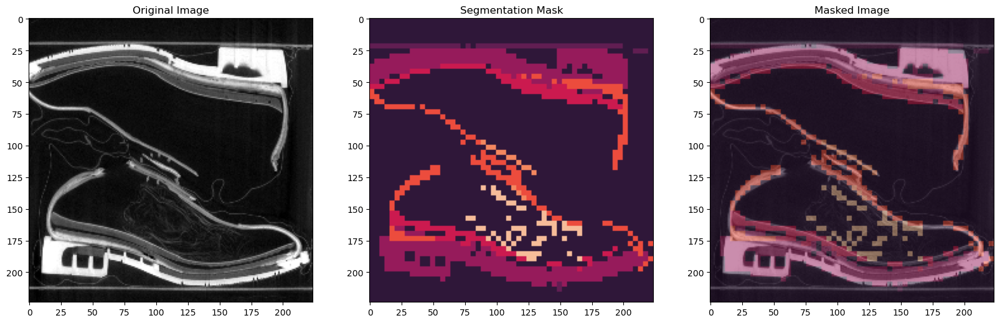

In [12]:
def give_color_to_seg_img(seg, n_classes=N_CLASSES):
    # Initialize a tensor for the colored segmentation image with channels first
    seg_img = torch.zeros((3, seg.shape[1], seg.shape[2]), dtype=torch.float32)
    # colors = sns.color_palette("hls", n_classes)
    colors = sns.color_palette("rocket", n_classes)
    
    seg = seg.squeeze(0) 
    for c in range(n_classes):
        segc = (seg == c)
        seg_img[0,:,:] += segc * colors[c][0]
        seg_img[1,:,:] += segc * colors[c][1]
        seg_img[2,:,:] += segc * colors[c][2]

    return(seg_img)

volumes = volumes.to("cpu")
segs = segs.to("cpu")

idx = 0
volume = volumes[idx].squeeze(0)
seg = segs[idx].squeeze(0)

image = volume[volume.shape[0]//2,:,:]
H, W = image.shape[0], image.shape[1]

seg = seg[seg.shape[0]//2,:,:]
seg = cv2.resize(seg.numpy(), (W, H), interpolation=cv2.INTER_NEAREST) # i.e. StiefelXY: original image and masks have different sizes (968x1130) vs (971x1101) ...
seg = torch.from_numpy(seg).unsqueeze(0)

seg = give_color_to_seg_img(seg)

# Convert tensors to numpy arrays for visualization
image_np = image.numpy()  
seg_np = seg.permute(1, 2, 0).numpy() # Convert from (C, H, W) to (H, W, C)

# Convert tensors to numpy arrays for visualization
masked_image_np = np.stack([image_np] * 3, axis=-1) * 0.5 + seg_np * 0.5

fig, axs = plt.subplots(1, 3, figsize=(20,20))
axs[0].imshow(image_np, cmap="gray")
axs[0].set_title("Original Image")
axs[1].imshow(seg_np)
axs[1].set_title("Segmentation Mask")
axs[2].imshow(masked_image_np)
axs[2].set_title("Masked Image")
plt.show()

In [13]:
model = SegFormer(model_type=MODEL, shvit_type=SHVIT_TYPE, input_shape=(1, DEPTH, HEIGHT, WIDTH), num_convs=N_CONVS, num_stages=N_STAGES, num_classes=N_CLASSES, use_center_att=USE_CENTER_ATT, use_resize=USE_RESIZE)

In [14]:
def get_model_stats(model):
    # Calculate the size for parameters (weights) and buffers
    param_size = sum(p.numel() * p.element_size() for p in model.parameters())
    buffer_size = sum(b.numel() * b.element_size() for b in model.buffers())
    total_size_bytes = param_size + buffer_size
    total_size_mb = total_size_bytes / (1024 ** 2)

    # Count the trainable and non-trainable parameters
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    non_trainable_params = sum(p.numel() for p in model.parameters() if not p.requires_grad)
    
    return total_size_mb, trainable_params, non_trainable_params

# Example usage:
model_size, trainable, non_trainable = get_model_stats(model)
print(f"Model size: {model_size:.2f} MB")
print(f"Trainable parameters: {trainable}")
print(f"Non-trainable parameters: {non_trainable}")

Model size: 52.89 MB
Trainable parameters: 13807103
Non-trainable parameters: 0


In [15]:
# Iterate over the layers of the model
for name, layer in model.named_children():
    print(f"Layer: {name}")
    print(f"  Type: {layer.__class__.__name__}")
    
    for param_name, param in layer.named_parameters(recurse=False):
        print(f" Weight dtype: {param.dtype} | Weight name: {param_name} | Shape: {param.shape}")

Layer: shvit
  Type: SHViT3D
Layer: seg_former_head
  Type: SegFormerHead3D
Layer: resize_layer
  Type: ResizeLayer3D


In [16]:
# import torch
# from torchviz import make_dot

# # Forward pass through the model to get the graph
# model_output = model(volumes)

# # # Generate and save the model graph
# model_graph = make_dot(model_output, params=dict(model.named_parameters()))
# model_graph.render(f"segformer_model_structure_{MODEL_NAME}", format="png")

In [17]:
# # Iterate over the layers of the model
# for name, layer in model.named_children():
#     # Check if the layer has parameters and print their trainability status
#     has_trainable_params = any(param.requires_grad for param in layer.parameters(recurse=False))
#     print(f"Layer: {name} | Trainable: {has_trainable_params}")

In [18]:
def iou_metric(y_true, y_pred, smooth=1, num_classes=N_CLASSES):
    # Flatten y_true
    y_true = y_true.reshape(-1).float()  # Ensure y_true is float32 and flatten

    # Reshape y_pred to match
    y_pred = y_pred.permute(0, 2, 3, 4, 1).reshape(-1,num_classes).float()  # (batch_size * height * width, num_classes)

    iou_per_class = []
    for class_id in range(num_classes):
        true_mask = (y_true == class_id).float()  # Binary mask for class
        pred_mask = y_pred[:, class_id]  # Softmax probability for class

        intersection = torch.sum(true_mask * pred_mask)
        union = torch.sum(true_mask) + torch.sum(pred_mask) - intersection

        iou = (intersection + smooth) / (union + smooth)
        iou_per_class.append(iou)  # Store IoU for each class

    return torch.mean(torch.stack(iou_per_class)), iou_per_class

def jaccard_distance_loss(y_true, y_pred, smooth=1, num_classes=N_CLASSES):
    iou, _ = iou_metric(y_true, y_pred, smooth=smooth, num_classes=num_classes)
    return 1 - iou



def f1_score_metric(y_true, y_pred, smooth=1, num_classes=N_CLASSES):
    y_true = y_true.reshape(-1).float()  # Flatten ground truth
    y_pred = y_pred.permute(0, 2, 3, 4, 1).reshape(-1, num_classes).float()  # Reshape prediction

    f1_per_class = []
    for class_id in range(num_classes):
        true_mask = (y_true == class_id).float()
        pred_mask = y_pred[:, class_id]

        intersection = torch.sum(true_mask * pred_mask)
        denominator = torch.sum(true_mask) + torch.sum(pred_mask)

        f1 = (2 * intersection + smooth) / (denominator + smooth)
        f1_per_class.append(f1)

    return torch.mean(torch.stack(f1_per_class)), f1_per_class


def dice_loss(y_true, y_pred, smooth=1, num_classes=N_CLASSES):
    f1, _ = f1_score_metric(y_true, y_pred, smooth, num_classes)
    return 1 - f1

In [19]:
class WarmupSchedulerWithReduceLROnPlateau:
    def __init__(self, optimizer, warmup_epochs, initial_lr, target_lr, 
                 reduce_lr_factor=0.1, min_lr=1e-6, patience=5, monitor="val_loss", mode="min"):

        self.optimizer = optimizer
        self.warmup_epochs = warmup_epochs
        self.initial_lr = initial_lr
        self.target_lr = target_lr
        self.reduce_lr_factor = reduce_lr_factor
        self.patience = patience
        self.min_lr = min_lr
        self.monitor = monitor
        self.mode = mode
        self.epoch = 0
        self.best_metric = np.inf if mode == "min" else -np.inf
        self.wait = 0
        self.last_epoch_metric_value = None
        self.new_lr = None
        for param_group in optimizer.param_groups:
            param_group["lr"] = initial_lr

    def on_epoch_begin(self, epoch):
        if epoch <= self.warmup_epochs:
            # Linear warm-up
            self.new_lr = self.initial_lr + (self.target_lr - self.initial_lr) * (epoch / self.warmup_epochs)
            for param_group in self.optimizer.param_groups:
                param_group["lr"] = self.new_lr
            print(f"Warmup: Setting LR to {self.new_lr:.8f}")
        else:
            for param_group in self.optimizer.param_groups:
                self.new_lr = param_group["lr"]
            print(f"Training: LR = {self.new_lr:.8f} ({self.wait})")

    def on_epoch_end(self, epoch, logs):
        self.epoch += 1
        metric_value = logs.get(self.monitor)

        if metric_value is None:
            return

        if epoch > self.warmup_epochs:
            if (self.mode == "min" and metric_value < self.best_metric) or (self.mode == "max" and metric_value > self.best_metric):
                self.best_metric = metric_value
                self.wait = 0  # Reset patience counter
                # print(f"\nwait (after if): {self.wait}")
            else:
                self.wait += 1
                # print(f"\nwait (after else): {self.wait}")
                if self.wait >= self.patience:
                    self.new_lr = max(self.new_lr * self.reduce_lr_factor, self.min_lr)
                    for param_group in self.optimizer.param_groups:
                        param_group["lr"] = self.new_lr
                    print(f"ReduceLROnPlateau: Reducing LR to {self.new_lr:.8f}")
                    self.wait = 0  # Reset patience counter


class EarlyStopping:
    def __init__(self, patience=50, monitor="val_loss", mode="min"):
        self.patience = patience
        self.monitor = monitor
        self.mode = mode
        self.counter = 0
        self.best_value = np.inf if mode == "min" else -np.inf
        self.early_stop = False

    def __call__(self, logs):
        monitor_value = logs.get(self.monitor)
        if self.mode == "min":
            if monitor_value < self.best_value:
                self.best_value = monitor_value
                self.counter = 0
            else:
                self.counter += 1
        else:
            if monitor_value > self.best_value:
                self.best_value = monitor_value
                self.counter = 0
            else:
                self.counter += 1

        if self.counter >= self.patience:
            self.early_stop = True
            

class CSVLogger:
    def __init__(self, filepath, append=False):
        self.filepath = filepath
        if not append and os.path.isfile(filepath):
            os.remove(filepath)
        self.file = open(filepath, "a", newline="")
        self.writer = csv.writer(self.file)
        self.write_header = True        

    def close(self, logs=None):
        self.file.close()

    def __call__(self, epoch=None, logs=None):
        if self.write_header:
            self.writer.writerow(["epoch"] + list(logs.keys()))
            self.write_header = False
        self.writer.writerow([epoch] + list(logs.values()))
        self.file.flush()  # Ensure data is written immediately

        
        
class ModelCheckpoint:
    def __init__(self, filepath, monitor="val_loss", mode="min", save_best_only=True, verbose=1):
        self.filepath = filepath
        self.monitor = monitor
        self.mode = mode
        self.save_best_only = save_best_only
        self.verbose = verbose
        self.best_value = None
        if self.mode == "min":
            self.best_value = np.inf
        else:
            self.best_value = -np.inf

    def __call__(self, model, optimizer, epoch, loss, logs):
        monitor_value = logs.get(self.monitor)
        
        def model_save(epoch, model, optimizer, loss, filename):
            torch.save(
            {
                'epoch': epoch, 
                'model_state_dict': model.state_dict(), 
                'optimizer_state_dict':  optimizer.state_dict(),
                'loss': loss, 
            }, filename)
    
        if not self.save_best_only:
            model_save(epoch, model, optimizer, loss, self.filepath)
            if self.verbose:
                print(f"\tModel saved to {self.filepath}")
            return

        if self.mode == "min":
            if monitor_value < self.best_value:
                self.best_value = monitor_value
                model_save(epoch, model, optimizer, loss, self.filepath)
                if self.verbose:
                    print(f"\tModel improved, saving to {self.filepath}")
        else:
            if monitor_value > self.best_value:
                self.best_value = monitor_value
                model_save(epoch, model, optimizer, loss, self.filepath)
                if self.verbose:
                    print(f"\tModel improved, saving to {self.filepath}")
                    

In [20]:
# Define optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)  # Start with small LR


scheduler = WarmupSchedulerWithReduceLROnPlateau(optimizer=optimizer, warmup_epochs=EPOCHS[0], 
                                                 initial_lr=1e-8, target_lr=LEARNING_RATE, reduce_lr_factor=0.5, min_lr=1e-8,
                                                 patience=15, monitor="val_dice_loss", mode="min")
early_stopping = EarlyStopping(patience=50, monitor="val_dice_loss", mode="min")
csv_logger = CSVLogger(filepath=f"{MODEL_NAME}_training.log", append=False)
checkpoint = ModelCheckpoint(filepath=f"seg_model_{MODEL_NAME}.pkl", monitor="val_dice_loss", mode="min", save_best_only=True, verbose=1)

In [21]:
train_dataloader = fabric.setup_dataloaders(train_dataloader)
val_dataloader = fabric.setup_dataloaders(val_dataloader)

model, optimizer = fabric.setup(model, optimizer)

In [22]:
max_grad_norm = 1.0

start = time.time()


for epoch in range(EPOCHS[1]):
    
    # At the beginning of the epoch, update the LR if in warmup phase
    scheduler.on_epoch_begin(epoch=epoch)
    
    train_iou, train_jaccard_loss = 0, 0
    val_iou, val_jaccard_loss = 0, 0
    train_f1, train_dice_loss = 0, 0
    val_f1, val_dice_loss = 0, 0
    step = 0
    
    with tqdm(total=len(train_dataloader), desc=f"Epoch {epoch+1}/{EPOCHS[1]}", unit="batch", colour="yellow", leave=True) as pbar:    
        start_time = time.time()  # Start timer    
    
        model.train()  # Set the model to training mode
        for batch_idx, (vols, segs, _) in enumerate(train_dataloader):
            step += 1
            
            output = model(vols)
            loss_jaccard = jaccard_distance_loss(segs, output)
            loss_dice = dice_loss(segs, output)
            train_jaccard_loss += loss_jaccard.item()
            train_dice_loss += loss_dice.item()
        
            fabric.backward(loss_jaccard) # using dice loss 

            if (batch_idx + 1) % ACCUMULATION_STEPS == 0:
                clip_grad_norm_(model.parameters(), max_grad_norm)
                optimizer.step()
                optimizer.zero_grad()  

            # Update progress bar
            pbar.set_postfix(loss=f"{train_jaccard_loss / min(step*BATCH_SIZE, len(train_dataloader)):.4f}")
            pbar.update(1)

        epoch_time = time.time() - start_time  # Calculate time taken                
            
        train_jaccard_loss /= len(train_dataloader)
        train_iou = 1 - train_jaccard_loss
        
        train_dice_loss /= len(train_dataloader)
        train_f1 = 1 - train_dice_loss

        # Validation phase
        model.eval()  # Set the model to evaluation mode
        with torch.no_grad():
            for vols, segs, _ in val_dataloader:
                output = model(vols)
                loss_jaccard = jaccard_distance_loss(segs, output)
                loss_dice = dice_loss(segs, output)
                val_jaccard_loss += loss_jaccard.item()
                val_dice_loss += loss_dice.item()
                
        val_jaccard_loss /= len(val_dataloader)
        val_iou = 1 - val_jaccard_loss
            
        val_dice_loss /= len(val_dataloader)
        val_f1 = 1 - val_dice_loss
        
        pbar.set_postfix(loss=f"train_jaccard_loss={train_jaccard_loss:.4f}, train_iou={train_iou:.4f}, val_jaccard_loss={val_jaccard_loss:.4f}, val_iou={val_iou:.4f}, train_dice_loss={train_dice_loss:.4f}, train_f1={train_f1:.4f}, val_dice_loss={val_dice_loss:.4f}, val_f1={val_f1:.4f}")
        
    
    # Callbacks for CSV_logger
    logs = {
        "train_jaccard_loss": train_jaccard_loss,
        "train_iou": train_iou,
        "val_jaccard_loss": val_jaccard_loss,
        "val_iou": val_iou,
        "train_dice_loss": train_dice_loss,
        "train_f1": train_f1,
        "val_dice_loss": val_dice_loss,
        "val_f1": val_f1,
        "epoch_time": epoch_time
    }    
    csv_logger(epoch=epoch+1, logs=logs)

    # At the end of the epoch, update the scheduler with the logs
    scheduler.on_epoch_end(epoch=epoch+1, logs=logs)    

    # Check if early stopping condition is met
    early_stopping(logs=logs)    
    if early_stopping.early_stop:
        print(f"Early stopping triggered at epoch {epoch+1}")
        break    

    # Save checkpoint file        
    checkpoint(model=model, optimizer=optimizer, epoch=epoch, loss=val_f1, logs=logs)
    
    
    
csv_logger.close()


end = time.time()

Warmup: Setting LR to 0.00000001


Epoch 1/2000: 100%|██████████| 40/40 [00:22<00:00,  1.75batch/s, loss=train_jaccard_loss=0.9679, train_iou=0.0321, val_jaccard_loss=0.9680, val_iou=0.0320, train_dice_loss=0.9413, train_f1=0.0587, val_dice_loss=0.9411, val_f1=0.0589]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Warmup: Setting LR to 0.00000501


Epoch 2/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.9678, train_iou=0.0322, val_jaccard_loss=0.9661, val_iou=0.0339, train_dice_loss=0.9410, train_f1=0.0590, val_dice_loss=0.9383, val_f1=0.0617]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Warmup: Setting LR to 0.00001001


Epoch 3/2000: 100%|██████████| 40/40 [00:21<00:00,  1.88batch/s, loss=train_jaccard_loss=0.9664, train_iou=0.0336, val_jaccard_loss=0.9657, val_iou=0.0343, train_dice_loss=0.9387, train_f1=0.0613, val_dice_loss=0.9374, val_f1=0.0626]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Warmup: Setting LR to 0.00001501


Epoch 4/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.9624, train_iou=0.0376, val_jaccard_loss=0.9617, val_iou=0.0383, train_dice_loss=0.9314, train_f1=0.0686, val_dice_loss=0.9306, val_f1=0.0694]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Warmup: Setting LR to 0.00002001


Epoch 5/2000: 100%|██████████| 40/40 [00:21<00:00,  1.88batch/s, loss=train_jaccard_loss=0.9508, train_iou=0.0492, val_jaccard_loss=0.9573, val_iou=0.0427, train_dice_loss=0.9125, train_f1=0.0875, val_dice_loss=0.9231, val_f1=0.0769]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Warmup: Setting LR to 0.00002501


Epoch 6/2000: 100%|██████████| 40/40 [00:21<00:00,  1.86batch/s, loss=train_jaccard_loss=0.9357, train_iou=0.0643, val_jaccard_loss=0.9515, val_iou=0.0485, train_dice_loss=0.8907, train_f1=0.1093, val_dice_loss=0.9139, val_f1=0.0861]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Warmup: Setting LR to 0.00003001


Epoch 7/2000: 100%|██████████| 40/40 [00:21<00:00,  1.87batch/s, loss=train_jaccard_loss=0.9096, train_iou=0.0904, val_jaccard_loss=0.9406, val_iou=0.0594, train_dice_loss=0.8566, train_f1=0.1434, val_dice_loss=0.8976, val_f1=0.1024]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Warmup: Setting LR to 0.00003501


Epoch 8/2000: 100%|██████████| 40/40 [00:21<00:00,  1.86batch/s, loss=train_jaccard_loss=0.8808, train_iou=0.1192, val_jaccard_loss=0.9289, val_iou=0.0711, train_dice_loss=0.8211, train_f1=0.1789, val_dice_loss=0.8814, val_f1=0.1186]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Warmup: Setting LR to 0.00004001


Epoch 9/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.8612, train_iou=0.1388, val_jaccard_loss=0.9121, val_iou=0.0879, train_dice_loss=0.7970, train_f1=0.2030, val_dice_loss=0.8590, val_f1=0.1410]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Warmup: Setting LR to 0.00004501


Epoch 10/2000: 100%|██████████| 40/40 [00:21<00:00,  1.87batch/s, loss=train_jaccard_loss=0.8466, train_iou=0.1534, val_jaccard_loss=0.9009, val_iou=0.0991, train_dice_loss=0.7777, train_f1=0.2223, val_dice_loss=0.8434, val_f1=0.1566]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Warmup: Setting LR to 0.00005001


Epoch 11/2000: 100%|██████████| 40/40 [00:21<00:00,  1.87batch/s, loss=train_jaccard_loss=0.8337, train_iou=0.1663, val_jaccard_loss=0.8837, val_iou=0.1163, train_dice_loss=0.7607, train_f1=0.2393, val_dice_loss=0.8214, val_f1=0.1786]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Warmup: Setting LR to 0.00005500


Epoch 12/2000: 100%|██████████| 40/40 [00:21<00:00,  1.88batch/s, loss=train_jaccard_loss=0.8225, train_iou=0.1775, val_jaccard_loss=0.8918, val_iou=0.1082, train_dice_loss=0.7457, train_f1=0.2543, val_dice_loss=0.8303, val_f1=0.1697]


Warmup: Setting LR to 0.00006000


Epoch 13/2000: 100%|██████████| 40/40 [00:21<00:00,  1.86batch/s, loss=train_jaccard_loss=0.8101, train_iou=0.1899, val_jaccard_loss=0.8605, val_iou=0.1395, train_dice_loss=0.7299, train_f1=0.2701, val_dice_loss=0.7911, val_f1=0.2089]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Warmup: Setting LR to 0.00006500


Epoch 14/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.8000, train_iou=0.2000, val_jaccard_loss=0.8629, val_iou=0.1371, train_dice_loss=0.7176, train_f1=0.2824, val_dice_loss=0.7924, val_f1=0.2076]


Warmup: Setting LR to 0.00007000


Epoch 15/2000: 100%|██████████| 40/40 [00:21<00:00,  1.86batch/s, loss=train_jaccard_loss=0.7863, train_iou=0.2137, val_jaccard_loss=0.8643, val_iou=0.1357, train_dice_loss=0.7009, train_f1=0.2991, val_dice_loss=0.7927, val_f1=0.2073]


Warmup: Setting LR to 0.00007500


Epoch 16/2000: 100%|██████████| 40/40 [00:21<00:00,  1.87batch/s, loss=train_jaccard_loss=0.7753, train_iou=0.2247, val_jaccard_loss=0.8308, val_iou=0.1692, train_dice_loss=0.6868, train_f1=0.3132, val_dice_loss=0.7534, val_f1=0.2466]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Warmup: Setting LR to 0.00008000


Epoch 17/2000: 100%|██████████| 40/40 [00:21<00:00,  1.86batch/s, loss=train_jaccard_loss=0.7647, train_iou=0.2353, val_jaccard_loss=0.8260, val_iou=0.1740, train_dice_loss=0.6750, train_f1=0.3250, val_dice_loss=0.7451, val_f1=0.2549]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Warmup: Setting LR to 0.00008500


Epoch 18/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.7571, train_iou=0.2429, val_jaccard_loss=0.8052, val_iou=0.1948, train_dice_loss=0.6658, train_f1=0.3342, val_dice_loss=0.7220, val_f1=0.2780]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Warmup: Setting LR to 0.00009000


Epoch 19/2000: 100%|██████████| 40/40 [00:21<00:00,  1.87batch/s, loss=train_jaccard_loss=0.7418, train_iou=0.2582, val_jaccard_loss=0.8229, val_iou=0.1771, train_dice_loss=0.6479, train_f1=0.3521, val_dice_loss=0.7401, val_f1=0.2599]


Warmup: Setting LR to 0.00009500


Epoch 20/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.7324, train_iou=0.2676, val_jaccard_loss=0.8159, val_iou=0.1841, train_dice_loss=0.6369, train_f1=0.3631, val_dice_loss=0.7309, val_f1=0.2691]


Warmup: Setting LR to 0.00010000


Epoch 21/2000: 100%|██████████| 40/40 [00:21<00:00,  1.87batch/s, loss=train_jaccard_loss=0.7212, train_iou=0.2788, val_jaccard_loss=0.8619, val_iou=0.1381, train_dice_loss=0.6241, train_f1=0.3759, val_dice_loss=0.7896, val_f1=0.2104]


Training: LR = 0.00010000 (0)


Epoch 22/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.7157, train_iou=0.2843, val_jaccard_loss=0.7628, val_iou=0.2372, train_dice_loss=0.6162, train_f1=0.3838, val_dice_loss=0.6715, val_f1=0.3285]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Training: LR = 0.00010000 (0)


Epoch 23/2000: 100%|██████████| 40/40 [00:21<00:00,  1.87batch/s, loss=train_jaccard_loss=0.6960, train_iou=0.3040, val_jaccard_loss=0.7595, val_iou=0.2405, train_dice_loss=0.5950, train_f1=0.4050, val_dice_loss=0.6671, val_f1=0.3329]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Training: LR = 0.00010000 (0)


Epoch 24/2000: 100%|██████████| 40/40 [00:21<00:00,  1.87batch/s, loss=train_jaccard_loss=0.6907, train_iou=0.3093, val_jaccard_loss=0.7508, val_iou=0.2492, train_dice_loss=0.5890, train_f1=0.4110, val_dice_loss=0.6555, val_f1=0.3445]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Training: LR = 0.00010000 (0)


Epoch 25/2000: 100%|██████████| 40/40 [00:21<00:00,  1.87batch/s, loss=train_jaccard_loss=0.6900, train_iou=0.3100, val_jaccard_loss=0.7558, val_iou=0.2442, train_dice_loss=0.5895, train_f1=0.4105, val_dice_loss=0.6600, val_f1=0.3400]


Training: LR = 0.00010000 (1)


Epoch 26/2000: 100%|██████████| 40/40 [00:21<00:00,  1.87batch/s, loss=train_jaccard_loss=0.6801, train_iou=0.3199, val_jaccard_loss=0.7408, val_iou=0.2592, train_dice_loss=0.5790, train_f1=0.4210, val_dice_loss=0.6465, val_f1=0.3535]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Training: LR = 0.00010000 (0)


Epoch 27/2000: 100%|██████████| 40/40 [00:21<00:00,  1.86batch/s, loss=train_jaccard_loss=0.6680, train_iou=0.3320, val_jaccard_loss=0.7245, val_iou=0.2755, train_dice_loss=0.5656, train_f1=0.4344, val_dice_loss=0.6277, val_f1=0.3723]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Training: LR = 0.00010000 (0)


Epoch 28/2000: 100%|██████████| 40/40 [00:21<00:00,  1.86batch/s, loss=train_jaccard_loss=0.6645, train_iou=0.3355, val_jaccard_loss=0.7018, val_iou=0.2982, train_dice_loss=0.5613, train_f1=0.4387, val_dice_loss=0.6027, val_f1=0.3973]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Training: LR = 0.00010000 (0)


Epoch 29/2000: 100%|██████████| 40/40 [00:21<00:00,  1.87batch/s, loss=train_jaccard_loss=0.6567, train_iou=0.3433, val_jaccard_loss=0.7196, val_iou=0.2804, train_dice_loss=0.5536, train_f1=0.4464, val_dice_loss=0.6225, val_f1=0.3775]


Training: LR = 0.00010000 (1)


Epoch 30/2000: 100%|██████████| 40/40 [00:21<00:00,  1.86batch/s, loss=train_jaccard_loss=0.6418, train_iou=0.3582, val_jaccard_loss=0.6981, val_iou=0.3019, train_dice_loss=0.5371, train_f1=0.4629, val_dice_loss=0.6008, val_f1=0.3992]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Training: LR = 0.00010000 (0)


Epoch 31/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.6442, train_iou=0.3558, val_jaccard_loss=0.6954, val_iou=0.3046, train_dice_loss=0.5407, train_f1=0.4593, val_dice_loss=0.5980, val_f1=0.4020]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Training: LR = 0.00010000 (0)


Epoch 32/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.6433, train_iou=0.3567, val_jaccard_loss=0.6687, val_iou=0.3313, train_dice_loss=0.5392, train_f1=0.4608, val_dice_loss=0.5687, val_f1=0.4313]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Training: LR = 0.00010000 (0)


Epoch 33/2000: 100%|██████████| 40/40 [00:21<00:00,  1.86batch/s, loss=train_jaccard_loss=0.6390, train_iou=0.3610, val_jaccard_loss=0.7166, val_iou=0.2834, train_dice_loss=0.5363, train_f1=0.4637, val_dice_loss=0.6232, val_f1=0.3768]


Training: LR = 0.00010000 (1)


Epoch 34/2000: 100%|██████████| 40/40 [00:21<00:00,  1.87batch/s, loss=train_jaccard_loss=0.6293, train_iou=0.3707, val_jaccard_loss=0.6595, val_iou=0.3405, train_dice_loss=0.5237, train_f1=0.4763, val_dice_loss=0.5591, val_f1=0.4409]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Training: LR = 0.00010000 (0)


Epoch 35/2000: 100%|██████████| 40/40 [00:21<00:00,  1.87batch/s, loss=train_jaccard_loss=0.6402, train_iou=0.3598, val_jaccard_loss=0.6590, val_iou=0.3410, train_dice_loss=0.5369, train_f1=0.4631, val_dice_loss=0.5587, val_f1=0.4413]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Training: LR = 0.00010000 (0)


Epoch 36/2000: 100%|██████████| 40/40 [00:21<00:00,  1.87batch/s, loss=train_jaccard_loss=0.6204, train_iou=0.3796, val_jaccard_loss=0.6517, val_iou=0.3483, train_dice_loss=0.5136, train_f1=0.4864, val_dice_loss=0.5505, val_f1=0.4495]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Training: LR = 0.00010000 (0)


Epoch 37/2000: 100%|██████████| 40/40 [00:21<00:00,  1.86batch/s, loss=train_jaccard_loss=0.6314, train_iou=0.3686, val_jaccard_loss=0.6472, val_iou=0.3528, train_dice_loss=0.5260, train_f1=0.4740, val_dice_loss=0.5453, val_f1=0.4547]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Training: LR = 0.00010000 (0)


Epoch 38/2000: 100%|██████████| 40/40 [00:21<00:00,  1.86batch/s, loss=train_jaccard_loss=0.6212, train_iou=0.3788, val_jaccard_loss=0.6547, val_iou=0.3453, train_dice_loss=0.5138, train_f1=0.4862, val_dice_loss=0.5560, val_f1=0.4440]


Training: LR = 0.00010000 (1)


Epoch 39/2000: 100%|██████████| 40/40 [00:21<00:00,  1.86batch/s, loss=train_jaccard_loss=0.6064, train_iou=0.3936, val_jaccard_loss=0.6392, val_iou=0.3608, train_dice_loss=0.4976, train_f1=0.5024, val_dice_loss=0.5373, val_f1=0.4627]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Training: LR = 0.00010000 (0)


Epoch 40/2000: 100%|██████████| 40/40 [00:21<00:00,  1.87batch/s, loss=train_jaccard_loss=0.6034, train_iou=0.3966, val_jaccard_loss=0.6475, val_iou=0.3525, train_dice_loss=0.4939, train_f1=0.5061, val_dice_loss=0.5484, val_f1=0.4516]


Training: LR = 0.00010000 (1)


Epoch 41/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.6023, train_iou=0.3977, val_jaccard_loss=0.6398, val_iou=0.3602, train_dice_loss=0.4930, train_f1=0.5070, val_dice_loss=0.5364, val_f1=0.4636]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Training: LR = 0.00010000 (0)


Epoch 42/2000: 100%|██████████| 40/40 [00:21<00:00,  1.86batch/s, loss=train_jaccard_loss=0.5988, train_iou=0.4012, val_jaccard_loss=0.6522, val_iou=0.3478, train_dice_loss=0.4883, train_f1=0.5117, val_dice_loss=0.5538, val_f1=0.4462]


Training: LR = 0.00010000 (1)


Epoch 43/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.6037, train_iou=0.3963, val_jaccard_loss=0.6342, val_iou=0.3658, train_dice_loss=0.4934, train_f1=0.5066, val_dice_loss=0.5306, val_f1=0.4694]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Training: LR = 0.00010000 (0)


Epoch 44/2000: 100%|██████████| 40/40 [00:21<00:00,  1.86batch/s, loss=train_jaccard_loss=0.5991, train_iou=0.4009, val_jaccard_loss=0.6441, val_iou=0.3559, train_dice_loss=0.4893, train_f1=0.5107, val_dice_loss=0.5440, val_f1=0.4560]


Training: LR = 0.00010000 (1)


Epoch 45/2000: 100%|██████████| 40/40 [00:21<00:00,  1.87batch/s, loss=train_jaccard_loss=0.5925, train_iou=0.4075, val_jaccard_loss=0.6346, val_iou=0.3654, train_dice_loss=0.4809, train_f1=0.5191, val_dice_loss=0.5307, val_f1=0.4693]


Training: LR = 0.00010000 (2)


Epoch 46/2000: 100%|██████████| 40/40 [00:21<00:00,  1.86batch/s, loss=train_jaccard_loss=0.5901, train_iou=0.4099, val_jaccard_loss=0.6401, val_iou=0.3599, train_dice_loss=0.4779, train_f1=0.5221, val_dice_loss=0.5407, val_f1=0.4593]


Training: LR = 0.00010000 (3)


Epoch 47/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.5875, train_iou=0.4125, val_jaccard_loss=0.6625, val_iou=0.3375, train_dice_loss=0.4746, train_f1=0.5254, val_dice_loss=0.5650, val_f1=0.4350]


Training: LR = 0.00010000 (4)


Epoch 48/2000: 100%|██████████| 40/40 [00:21<00:00,  1.86batch/s, loss=train_jaccard_loss=0.5807, train_iou=0.4193, val_jaccard_loss=0.6401, val_iou=0.3599, train_dice_loss=0.4678, train_f1=0.5322, val_dice_loss=0.5387, val_f1=0.4613]


Training: LR = 0.00010000 (5)


Epoch 49/2000: 100%|██████████| 40/40 [00:21<00:00,  1.86batch/s, loss=train_jaccard_loss=0.5880, train_iou=0.4120, val_jaccard_loss=0.6403, val_iou=0.3597, train_dice_loss=0.4764, train_f1=0.5236, val_dice_loss=0.5421, val_f1=0.4579]


Training: LR = 0.00010000 (6)


Epoch 50/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.5787, train_iou=0.4213, val_jaccard_loss=0.6322, val_iou=0.3678, train_dice_loss=0.4663, train_f1=0.5337, val_dice_loss=0.5285, val_f1=0.4715]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Training: LR = 0.00010000 (0)


Epoch 51/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5783, train_iou=0.4217, val_jaccard_loss=0.6214, val_iou=0.3786, train_dice_loss=0.4654, train_f1=0.5346, val_dice_loss=0.5185, val_f1=0.4815]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Training: LR = 0.00010000 (0)


Epoch 52/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5765, train_iou=0.4235, val_jaccard_loss=0.6267, val_iou=0.3733, train_dice_loss=0.4627, train_f1=0.5373, val_dice_loss=0.5266, val_f1=0.4734]


Training: LR = 0.00010000 (1)


Epoch 53/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.5783, train_iou=0.4217, val_jaccard_loss=0.6472, val_iou=0.3528, train_dice_loss=0.4653, train_f1=0.5347, val_dice_loss=0.5487, val_f1=0.4513]


Training: LR = 0.00010000 (2)


Epoch 54/2000: 100%|██████████| 40/40 [00:21<00:00,  1.86batch/s, loss=train_jaccard_loss=0.5730, train_iou=0.4270, val_jaccard_loss=0.6306, val_iou=0.3694, train_dice_loss=0.4591, train_f1=0.5409, val_dice_loss=0.5253, val_f1=0.4747]


Training: LR = 0.00010000 (3)


Epoch 55/2000: 100%|██████████| 40/40 [00:21<00:00,  1.87batch/s, loss=train_jaccard_loss=0.5741, train_iou=0.4259, val_jaccard_loss=0.6421, val_iou=0.3579, train_dice_loss=0.4599, train_f1=0.5401, val_dice_loss=0.5355, val_f1=0.4645]


Training: LR = 0.00010000 (4)


Epoch 56/2000: 100%|██████████| 40/40 [00:21<00:00,  1.88batch/s, loss=train_jaccard_loss=0.5659, train_iou=0.4341, val_jaccard_loss=0.6294, val_iou=0.3706, train_dice_loss=0.4513, train_f1=0.5487, val_dice_loss=0.5247, val_f1=0.4753]


Training: LR = 0.00010000 (5)


Epoch 57/2000: 100%|██████████| 40/40 [00:21<00:00,  1.87batch/s, loss=train_jaccard_loss=0.5664, train_iou=0.4336, val_jaccard_loss=0.6382, val_iou=0.3618, train_dice_loss=0.4531, train_f1=0.5469, val_dice_loss=0.5340, val_f1=0.4660]


Training: LR = 0.00010000 (6)


Epoch 58/2000: 100%|██████████| 40/40 [00:21<00:00,  1.86batch/s, loss=train_jaccard_loss=0.5664, train_iou=0.4336, val_jaccard_loss=0.6416, val_iou=0.3584, train_dice_loss=0.4523, train_f1=0.5477, val_dice_loss=0.5455, val_f1=0.4545]


Training: LR = 0.00010000 (7)


Epoch 59/2000: 100%|██████████| 40/40 [00:21<00:00,  1.87batch/s, loss=train_jaccard_loss=0.5701, train_iou=0.4299, val_jaccard_loss=0.6387, val_iou=0.3613, train_dice_loss=0.4561, train_f1=0.5439, val_dice_loss=0.5363, val_f1=0.4637]


Training: LR = 0.00010000 (8)


Epoch 60/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.5627, train_iou=0.4373, val_jaccard_loss=0.6222, val_iou=0.3778, train_dice_loss=0.4492, train_f1=0.5508, val_dice_loss=0.5187, val_f1=0.4813]


Training: LR = 0.00010000 (9)


Epoch 61/2000: 100%|██████████| 40/40 [00:21<00:00,  1.88batch/s, loss=train_jaccard_loss=0.5658, train_iou=0.4342, val_jaccard_loss=0.6825, val_iou=0.3175, train_dice_loss=0.4517, train_f1=0.5483, val_dice_loss=0.5828, val_f1=0.4172]


Training: LR = 0.00010000 (10)


Epoch 62/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5661, train_iou=0.4339, val_jaccard_loss=0.6703, val_iou=0.3297, train_dice_loss=0.4526, train_f1=0.5474, val_dice_loss=0.5689, val_f1=0.4311]


Training: LR = 0.00010000 (11)


Epoch 63/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5545, train_iou=0.4455, val_jaccard_loss=0.6670, val_iou=0.3330, train_dice_loss=0.4390, train_f1=0.5610, val_dice_loss=0.5763, val_f1=0.4237]


Training: LR = 0.00010000 (12)


Epoch 64/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5493, train_iou=0.4507, val_jaccard_loss=0.6267, val_iou=0.3733, train_dice_loss=0.4345, train_f1=0.5655, val_dice_loss=0.5219, val_f1=0.4781]


Training: LR = 0.00010000 (13)


Epoch 65/2000: 100%|██████████| 40/40 [00:22<00:00,  1.81batch/s, loss=train_jaccard_loss=0.5508, train_iou=0.4492, val_jaccard_loss=0.6140, val_iou=0.3860, train_dice_loss=0.4363, train_f1=0.5637, val_dice_loss=0.5080, val_f1=0.4920]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Training: LR = 0.00010000 (0)


Epoch 66/2000: 100%|██████████| 40/40 [00:22<00:00,  1.81batch/s, loss=train_jaccard_loss=0.5505, train_iou=0.4495, val_jaccard_loss=0.6299, val_iou=0.3701, train_dice_loss=0.4362, train_f1=0.5638, val_dice_loss=0.5251, val_f1=0.4749]


Training: LR = 0.00010000 (1)


Epoch 67/2000: 100%|██████████| 40/40 [00:21<00:00,  1.83batch/s, loss=train_jaccard_loss=0.5576, train_iou=0.4424, val_jaccard_loss=0.6178, val_iou=0.3822, train_dice_loss=0.4434, train_f1=0.5566, val_dice_loss=0.5111, val_f1=0.4889]


Training: LR = 0.00010000 (2)


Epoch 68/2000: 100%|██████████| 40/40 [00:21<00:00,  1.82batch/s, loss=train_jaccard_loss=0.5481, train_iou=0.4519, val_jaccard_loss=0.6693, val_iou=0.3307, train_dice_loss=0.4327, train_f1=0.5673, val_dice_loss=0.5810, val_f1=0.4190]


Training: LR = 0.00010000 (3)


Epoch 69/2000: 100%|██████████| 40/40 [00:21<00:00,  1.83batch/s, loss=train_jaccard_loss=0.5489, train_iou=0.4511, val_jaccard_loss=0.6309, val_iou=0.3691, train_dice_loss=0.4342, train_f1=0.5658, val_dice_loss=0.5277, val_f1=0.4723]


Training: LR = 0.00010000 (4)


Epoch 70/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5535, train_iou=0.4465, val_jaccard_loss=0.5997, val_iou=0.4003, train_dice_loss=0.4391, train_f1=0.5609, val_dice_loss=0.4934, val_f1=0.5066]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Training: LR = 0.00010000 (0)


Epoch 71/2000: 100%|██████████| 40/40 [00:21<00:00,  1.82batch/s, loss=train_jaccard_loss=0.5512, train_iou=0.4488, val_jaccard_loss=0.6335, val_iou=0.3665, train_dice_loss=0.4361, train_f1=0.5639, val_dice_loss=0.5258, val_f1=0.4742]


Training: LR = 0.00010000 (1)


Epoch 72/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5429, train_iou=0.4571, val_jaccard_loss=0.6137, val_iou=0.3863, train_dice_loss=0.4272, train_f1=0.5728, val_dice_loss=0.5085, val_f1=0.4915]


Training: LR = 0.00010000 (2)


Epoch 73/2000: 100%|██████████| 40/40 [00:21<00:00,  1.83batch/s, loss=train_jaccard_loss=0.5427, train_iou=0.4573, val_jaccard_loss=0.6118, val_iou=0.3882, train_dice_loss=0.4265, train_f1=0.5735, val_dice_loss=0.5065, val_f1=0.4935]


Training: LR = 0.00010000 (3)


Epoch 74/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5382, train_iou=0.4618, val_jaccard_loss=0.6295, val_iou=0.3705, train_dice_loss=0.4228, train_f1=0.5772, val_dice_loss=0.5218, val_f1=0.4782]


Training: LR = 0.00010000 (4)


Epoch 75/2000: 100%|██████████| 40/40 [00:21<00:00,  1.83batch/s, loss=train_jaccard_loss=0.5428, train_iou=0.4572, val_jaccard_loss=0.6020, val_iou=0.3980, train_dice_loss=0.4280, train_f1=0.5720, val_dice_loss=0.4944, val_f1=0.5056]


Training: LR = 0.00010000 (5)


Epoch 76/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5408, train_iou=0.4592, val_jaccard_loss=0.6084, val_iou=0.3916, train_dice_loss=0.4259, train_f1=0.5741, val_dice_loss=0.5028, val_f1=0.4972]


Training: LR = 0.00010000 (6)


Epoch 77/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5346, train_iou=0.4654, val_jaccard_loss=0.6184, val_iou=0.3816, train_dice_loss=0.4193, train_f1=0.5807, val_dice_loss=0.5110, val_f1=0.4890]


Training: LR = 0.00010000 (7)


Epoch 78/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.5364, train_iou=0.4636, val_jaccard_loss=0.6601, val_iou=0.3399, train_dice_loss=0.4207, train_f1=0.5793, val_dice_loss=0.5558, val_f1=0.4442]


Training: LR = 0.00010000 (8)


Epoch 79/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5351, train_iou=0.4649, val_jaccard_loss=0.6594, val_iou=0.3406, train_dice_loss=0.4191, train_f1=0.5809, val_dice_loss=0.5668, val_f1=0.4332]


Training: LR = 0.00010000 (9)


Epoch 80/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5318, train_iou=0.4682, val_jaccard_loss=0.6230, val_iou=0.3770, train_dice_loss=0.4167, train_f1=0.5833, val_dice_loss=0.5159, val_f1=0.4841]


Training: LR = 0.00010000 (10)


Epoch 81/2000: 100%|██████████| 40/40 [00:21<00:00,  1.83batch/s, loss=train_jaccard_loss=0.5310, train_iou=0.4690, val_jaccard_loss=0.6239, val_iou=0.3761, train_dice_loss=0.4143, train_f1=0.5857, val_dice_loss=0.5172, val_f1=0.4828]


Training: LR = 0.00010000 (11)


Epoch 82/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5295, train_iou=0.4705, val_jaccard_loss=0.6596, val_iou=0.3404, train_dice_loss=0.4140, train_f1=0.5860, val_dice_loss=0.5599, val_f1=0.4401]


Training: LR = 0.00010000 (12)


Epoch 83/2000: 100%|██████████| 40/40 [00:21<00:00,  1.83batch/s, loss=train_jaccard_loss=0.5248, train_iou=0.4752, val_jaccard_loss=0.6035, val_iou=0.3965, train_dice_loss=0.4094, train_f1=0.5906, val_dice_loss=0.4975, val_f1=0.5025]


Training: LR = 0.00010000 (13)


Epoch 84/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5380, train_iou=0.4620, val_jaccard_loss=0.5977, val_iou=0.4023, train_dice_loss=0.4202, train_f1=0.5798, val_dice_loss=0.4888, val_f1=0.5112]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Training: LR = 0.00010000 (0)


Epoch 85/2000: 100%|██████████| 40/40 [00:21<00:00,  1.83batch/s, loss=train_jaccard_loss=0.5332, train_iou=0.4668, val_jaccard_loss=0.6203, val_iou=0.3797, train_dice_loss=0.4186, train_f1=0.5814, val_dice_loss=0.5113, val_f1=0.4887]


Training: LR = 0.00010000 (1)


Epoch 86/2000: 100%|██████████| 40/40 [00:21<00:00,  1.82batch/s, loss=train_jaccard_loss=0.5214, train_iou=0.4786, val_jaccard_loss=0.6176, val_iou=0.3824, train_dice_loss=0.4043, train_f1=0.5957, val_dice_loss=0.5094, val_f1=0.4906]


Training: LR = 0.00010000 (2)


Epoch 87/2000: 100%|██████████| 40/40 [00:21<00:00,  1.83batch/s, loss=train_jaccard_loss=0.5346, train_iou=0.4654, val_jaccard_loss=0.6161, val_iou=0.3839, train_dice_loss=0.4188, train_f1=0.5812, val_dice_loss=0.5076, val_f1=0.4924]


Training: LR = 0.00010000 (3)


Epoch 88/2000: 100%|██████████| 40/40 [00:21<00:00,  1.83batch/s, loss=train_jaccard_loss=0.5318, train_iou=0.4682, val_jaccard_loss=0.5977, val_iou=0.4023, train_dice_loss=0.4152, train_f1=0.5848, val_dice_loss=0.4870, val_f1=0.5130]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Training: LR = 0.00010000 (0)


Epoch 89/2000: 100%|██████████| 40/40 [00:21<00:00,  1.83batch/s, loss=train_jaccard_loss=0.5211, train_iou=0.4789, val_jaccard_loss=0.5942, val_iou=0.4058, train_dice_loss=0.4052, train_f1=0.5948, val_dice_loss=0.4877, val_f1=0.5123]


Training: LR = 0.00010000 (1)


Epoch 90/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5163, train_iou=0.4837, val_jaccard_loss=0.6275, val_iou=0.3725, train_dice_loss=0.4008, train_f1=0.5992, val_dice_loss=0.5199, val_f1=0.4801]


Training: LR = 0.00010000 (2)


Epoch 91/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5175, train_iou=0.4825, val_jaccard_loss=0.5965, val_iou=0.4035, train_dice_loss=0.3996, train_f1=0.6004, val_dice_loss=0.4881, val_f1=0.5119]


Training: LR = 0.00010000 (3)


Epoch 92/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.5201, train_iou=0.4799, val_jaccard_loss=0.6198, val_iou=0.3802, train_dice_loss=0.4033, train_f1=0.5967, val_dice_loss=0.5154, val_f1=0.4846]


Training: LR = 0.00010000 (4)


Epoch 93/2000: 100%|██████████| 40/40 [00:21<00:00,  1.83batch/s, loss=train_jaccard_loss=0.5258, train_iou=0.4742, val_jaccard_loss=0.6117, val_iou=0.3883, train_dice_loss=0.4097, train_f1=0.5903, val_dice_loss=0.5028, val_f1=0.4972]


Training: LR = 0.00010000 (5)


Epoch 94/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.5180, train_iou=0.4820, val_jaccard_loss=0.6472, val_iou=0.3528, train_dice_loss=0.4010, train_f1=0.5990, val_dice_loss=0.5381, val_f1=0.4619]


Training: LR = 0.00010000 (6)


Epoch 95/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.5237, train_iou=0.4763, val_jaccard_loss=0.5986, val_iou=0.4014, train_dice_loss=0.4083, train_f1=0.5917, val_dice_loss=0.4886, val_f1=0.5114]


Training: LR = 0.00010000 (7)


Epoch 96/2000: 100%|██████████| 40/40 [00:21<00:00,  1.86batch/s, loss=train_jaccard_loss=0.5195, train_iou=0.4805, val_jaccard_loss=0.6198, val_iou=0.3802, train_dice_loss=0.4034, train_f1=0.5966, val_dice_loss=0.5102, val_f1=0.4898]


Training: LR = 0.00010000 (8)


Epoch 97/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5193, train_iou=0.4807, val_jaccard_loss=0.6226, val_iou=0.3774, train_dice_loss=0.4015, train_f1=0.5985, val_dice_loss=0.5198, val_f1=0.4802]


Training: LR = 0.00010000 (9)


Epoch 98/2000: 100%|██████████| 40/40 [00:21<00:00,  1.83batch/s, loss=train_jaccard_loss=0.5178, train_iou=0.4822, val_jaccard_loss=0.6136, val_iou=0.3864, train_dice_loss=0.4019, train_f1=0.5981, val_dice_loss=0.5039, val_f1=0.4961]


Training: LR = 0.00010000 (10)


Epoch 99/2000: 100%|██████████| 40/40 [00:21<00:00,  1.83batch/s, loss=train_jaccard_loss=0.5163, train_iou=0.4837, val_jaccard_loss=0.6258, val_iou=0.3742, train_dice_loss=0.3980, train_f1=0.6020, val_dice_loss=0.5191, val_f1=0.4809]


Training: LR = 0.00010000 (11)


Epoch 100/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.5125, train_iou=0.4875, val_jaccard_loss=0.5951, val_iou=0.4049, train_dice_loss=0.3961, train_f1=0.6039, val_dice_loss=0.4874, val_f1=0.5126]


Training: LR = 0.00010000 (12)


Epoch 101/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.5105, train_iou=0.4895, val_jaccard_loss=0.6516, val_iou=0.3484, train_dice_loss=0.3924, train_f1=0.6076, val_dice_loss=0.5499, val_f1=0.4501]


Training: LR = 0.00010000 (13)


Epoch 102/2000: 100%|██████████| 40/40 [00:21<00:00,  1.83batch/s, loss=train_jaccard_loss=0.5157, train_iou=0.4843, val_jaccard_loss=0.6405, val_iou=0.3595, train_dice_loss=0.3981, train_f1=0.6019, val_dice_loss=0.5370, val_f1=0.4630]


Training: LR = 0.00010000 (14)


Epoch 103/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.5071, train_iou=0.4929, val_jaccard_loss=0.6699, val_iou=0.3301, train_dice_loss=0.3895, train_f1=0.6105, val_dice_loss=0.5799, val_f1=0.4201]


ReduceLROnPlateau: Reducing LR to 0.00005000
Training: LR = 0.00005000 (0)


Epoch 104/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.5022, train_iou=0.4978, val_jaccard_loss=0.6535, val_iou=0.3465, train_dice_loss=0.3842, train_f1=0.6158, val_dice_loss=0.5559, val_f1=0.4441]


Training: LR = 0.00005000 (1)


Epoch 105/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5093, train_iou=0.4907, val_jaccard_loss=0.5980, val_iou=0.4020, train_dice_loss=0.3929, train_f1=0.6071, val_dice_loss=0.4870, val_f1=0.5130]


	Model improved, saving to seg_model_B5_S2_sw_SegFormer_2conv_224x224x224.pkl
Training: LR = 0.00005000 (0)


Epoch 106/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5008, train_iou=0.4992, val_jaccard_loss=0.6219, val_iou=0.3781, train_dice_loss=0.3823, train_f1=0.6177, val_dice_loss=0.5180, val_f1=0.4820]


Training: LR = 0.00005000 (1)


Epoch 107/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.5080, train_iou=0.4920, val_jaccard_loss=0.6199, val_iou=0.3801, train_dice_loss=0.3913, train_f1=0.6087, val_dice_loss=0.5151, val_f1=0.4849]


Training: LR = 0.00005000 (2)


Epoch 108/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5020, train_iou=0.4980, val_jaccard_loss=0.6263, val_iou=0.3737, train_dice_loss=0.3838, train_f1=0.6162, val_dice_loss=0.5175, val_f1=0.4825]


Training: LR = 0.00005000 (3)


Epoch 109/2000: 100%|██████████| 40/40 [00:21<00:00,  1.87batch/s, loss=train_jaccard_loss=0.4938, train_iou=0.5062, val_jaccard_loss=0.6327, val_iou=0.3673, train_dice_loss=0.3763, train_f1=0.6237, val_dice_loss=0.5271, val_f1=0.4729]


Training: LR = 0.00005000 (4)


Epoch 110/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5132, train_iou=0.4868, val_jaccard_loss=0.6137, val_iou=0.3863, train_dice_loss=0.3962, train_f1=0.6038, val_dice_loss=0.5056, val_f1=0.4944]


Training: LR = 0.00005000 (5)


Epoch 111/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5007, train_iou=0.4993, val_jaccard_loss=0.6138, val_iou=0.3862, train_dice_loss=0.3837, train_f1=0.6163, val_dice_loss=0.5036, val_f1=0.4964]


Training: LR = 0.00005000 (6)


Epoch 112/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5072, train_iou=0.4928, val_jaccard_loss=0.6004, val_iou=0.3996, train_dice_loss=0.3907, train_f1=0.6093, val_dice_loss=0.4905, val_f1=0.5095]


Training: LR = 0.00005000 (7)


Epoch 113/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.5088, train_iou=0.4912, val_jaccard_loss=0.6245, val_iou=0.3755, train_dice_loss=0.3907, train_f1=0.6093, val_dice_loss=0.5180, val_f1=0.4820]


Training: LR = 0.00005000 (8)


Epoch 114/2000: 100%|██████████| 40/40 [00:21<00:00,  1.87batch/s, loss=train_jaccard_loss=0.5089, train_iou=0.4911, val_jaccard_loss=0.6204, val_iou=0.3796, train_dice_loss=0.3905, train_f1=0.6095, val_dice_loss=0.5099, val_f1=0.4901]


Training: LR = 0.00005000 (9)


Epoch 115/2000: 100%|██████████| 40/40 [00:21<00:00,  1.86batch/s, loss=train_jaccard_loss=0.4992, train_iou=0.5008, val_jaccard_loss=0.6082, val_iou=0.3918, train_dice_loss=0.3816, train_f1=0.6184, val_dice_loss=0.4974, val_f1=0.5026]


Training: LR = 0.00005000 (10)


Epoch 116/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.4975, train_iou=0.5025, val_jaccard_loss=0.6435, val_iou=0.3565, train_dice_loss=0.3795, train_f1=0.6205, val_dice_loss=0.5449, val_f1=0.4551]


Training: LR = 0.00005000 (11)


Epoch 117/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5101, train_iou=0.4899, val_jaccard_loss=0.6057, val_iou=0.3943, train_dice_loss=0.3934, train_f1=0.6066, val_dice_loss=0.4961, val_f1=0.5039]


Training: LR = 0.00005000 (12)


Epoch 118/2000: 100%|██████████| 40/40 [00:21<00:00,  1.86batch/s, loss=train_jaccard_loss=0.5067, train_iou=0.4933, val_jaccard_loss=0.6600, val_iou=0.3400, train_dice_loss=0.3893, train_f1=0.6107, val_dice_loss=0.5546, val_f1=0.4454]


Training: LR = 0.00005000 (13)


Epoch 119/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5101, train_iou=0.4899, val_jaccard_loss=0.6274, val_iou=0.3726, train_dice_loss=0.3927, train_f1=0.6073, val_dice_loss=0.5180, val_f1=0.4820]


Training: LR = 0.00005000 (14)


Epoch 120/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.4980, train_iou=0.5020, val_jaccard_loss=0.6077, val_iou=0.3923, train_dice_loss=0.3808, train_f1=0.6192, val_dice_loss=0.4976, val_f1=0.5024]


ReduceLROnPlateau: Reducing LR to 0.00002500
Training: LR = 0.00002500 (0)


Epoch 121/2000: 100%|██████████| 40/40 [00:21<00:00,  1.83batch/s, loss=train_jaccard_loss=0.5026, train_iou=0.4974, val_jaccard_loss=0.6299, val_iou=0.3701, train_dice_loss=0.3854, train_f1=0.6146, val_dice_loss=0.5213, val_f1=0.4787]


Training: LR = 0.00002500 (1)


Epoch 122/2000: 100%|██████████| 40/40 [00:21<00:00,  1.83batch/s, loss=train_jaccard_loss=0.5050, train_iou=0.4950, val_jaccard_loss=0.6096, val_iou=0.3904, train_dice_loss=0.3872, train_f1=0.6128, val_dice_loss=0.4996, val_f1=0.5004]


Training: LR = 0.00002500 (2)


Epoch 123/2000: 100%|██████████| 40/40 [00:21<00:00,  1.86batch/s, loss=train_jaccard_loss=0.4983, train_iou=0.5017, val_jaccard_loss=0.6213, val_iou=0.3787, train_dice_loss=0.3801, train_f1=0.6199, val_dice_loss=0.5154, val_f1=0.4846]


Training: LR = 0.00002500 (3)


Epoch 124/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5036, train_iou=0.4964, val_jaccard_loss=0.6455, val_iou=0.3545, train_dice_loss=0.3860, train_f1=0.6140, val_dice_loss=0.5391, val_f1=0.4609]


Training: LR = 0.00002500 (4)


Epoch 125/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5000, train_iou=0.5000, val_jaccard_loss=0.6285, val_iou=0.3715, train_dice_loss=0.3835, train_f1=0.6165, val_dice_loss=0.5261, val_f1=0.4739]


Training: LR = 0.00002500 (5)


Epoch 126/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5034, train_iou=0.4966, val_jaccard_loss=0.6177, val_iou=0.3823, train_dice_loss=0.3861, train_f1=0.6139, val_dice_loss=0.5072, val_f1=0.4928]


Training: LR = 0.00002500 (6)


Epoch 127/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5023, train_iou=0.4977, val_jaccard_loss=0.6478, val_iou=0.3522, train_dice_loss=0.3859, train_f1=0.6141, val_dice_loss=0.5524, val_f1=0.4476]


Training: LR = 0.00002500 (7)


Epoch 128/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5100, train_iou=0.4900, val_jaccard_loss=0.6097, val_iou=0.3903, train_dice_loss=0.3930, train_f1=0.6070, val_dice_loss=0.4993, val_f1=0.5007]


Training: LR = 0.00002500 (8)


Epoch 129/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.4962, train_iou=0.5038, val_jaccard_loss=0.6130, val_iou=0.3870, train_dice_loss=0.3781, train_f1=0.6219, val_dice_loss=0.5044, val_f1=0.4956]


Training: LR = 0.00002500 (9)


Epoch 130/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.4969, train_iou=0.5031, val_jaccard_loss=0.6155, val_iou=0.3845, train_dice_loss=0.3802, train_f1=0.6198, val_dice_loss=0.5077, val_f1=0.4923]


Training: LR = 0.00002500 (10)


Epoch 131/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.5058, train_iou=0.4942, val_jaccard_loss=0.6223, val_iou=0.3777, train_dice_loss=0.3881, train_f1=0.6119, val_dice_loss=0.5151, val_f1=0.4849]


Training: LR = 0.00002500 (11)


Epoch 132/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.5036, train_iou=0.4964, val_jaccard_loss=0.6096, val_iou=0.3904, train_dice_loss=0.3880, train_f1=0.6120, val_dice_loss=0.4994, val_f1=0.5006]


Training: LR = 0.00002500 (12)


Epoch 133/2000: 100%|██████████| 40/40 [00:21<00:00,  1.87batch/s, loss=train_jaccard_loss=0.5122, train_iou=0.4878, val_jaccard_loss=0.6252, val_iou=0.3748, train_dice_loss=0.3959, train_f1=0.6041, val_dice_loss=0.5177, val_f1=0.4823]


Training: LR = 0.00002500 (13)


Epoch 134/2000: 100%|██████████| 40/40 [00:21<00:00,  1.88batch/s, loss=train_jaccard_loss=0.5038, train_iou=0.4962, val_jaccard_loss=0.6153, val_iou=0.3847, train_dice_loss=0.3863, train_f1=0.6137, val_dice_loss=0.5105, val_f1=0.4895]


Training: LR = 0.00002500 (14)


Epoch 135/2000: 100%|██████████| 40/40 [00:21<00:00,  1.87batch/s, loss=train_jaccard_loss=0.5053, train_iou=0.4947, val_jaccard_loss=0.6011, val_iou=0.3989, train_dice_loss=0.3872, train_f1=0.6128, val_dice_loss=0.4903, val_f1=0.5097]


ReduceLROnPlateau: Reducing LR to 0.00001250
Training: LR = 0.00001250 (0)


Epoch 136/2000: 100%|██████████| 40/40 [00:21<00:00,  1.86batch/s, loss=train_jaccard_loss=0.4989, train_iou=0.5011, val_jaccard_loss=0.6333, val_iou=0.3667, train_dice_loss=0.3812, train_f1=0.6188, val_dice_loss=0.5329, val_f1=0.4671]


Training: LR = 0.00001250 (1)


Epoch 137/2000: 100%|██████████| 40/40 [00:21<00:00,  1.88batch/s, loss=train_jaccard_loss=0.4956, train_iou=0.5044, val_jaccard_loss=0.6036, val_iou=0.3964, train_dice_loss=0.3782, train_f1=0.6218, val_dice_loss=0.4963, val_f1=0.5037]


Training: LR = 0.00001250 (2)


Epoch 138/2000: 100%|██████████| 40/40 [00:21<00:00,  1.88batch/s, loss=train_jaccard_loss=0.5015, train_iou=0.4985, val_jaccard_loss=0.6138, val_iou=0.3862, train_dice_loss=0.3839, train_f1=0.6161, val_dice_loss=0.5051, val_f1=0.4949]


Training: LR = 0.00001250 (3)


Epoch 139/2000: 100%|██████████| 40/40 [00:21<00:00,  1.88batch/s, loss=train_jaccard_loss=0.4963, train_iou=0.5037, val_jaccard_loss=0.6071, val_iou=0.3929, train_dice_loss=0.3781, train_f1=0.6219, val_dice_loss=0.4993, val_f1=0.5007]


Training: LR = 0.00001250 (4)


Epoch 140/2000: 100%|██████████| 40/40 [00:21<00:00,  1.87batch/s, loss=train_jaccard_loss=0.5038, train_iou=0.4962, val_jaccard_loss=0.5989, val_iou=0.4011, train_dice_loss=0.3874, train_f1=0.6126, val_dice_loss=0.4901, val_f1=0.5099]


Training: LR = 0.00001250 (5)


Epoch 141/2000: 100%|██████████| 40/40 [00:21<00:00,  1.89batch/s, loss=train_jaccard_loss=0.4921, train_iou=0.5079, val_jaccard_loss=0.6162, val_iou=0.3838, train_dice_loss=0.3753, train_f1=0.6247, val_dice_loss=0.5072, val_f1=0.4928]


Training: LR = 0.00001250 (6)


Epoch 142/2000: 100%|██████████| 40/40 [00:21<00:00,  1.87batch/s, loss=train_jaccard_loss=0.4999, train_iou=0.5001, val_jaccard_loss=0.6378, val_iou=0.3622, train_dice_loss=0.3836, train_f1=0.6164, val_dice_loss=0.5285, val_f1=0.4715]


Training: LR = 0.00001250 (7)


Epoch 143/2000: 100%|██████████| 40/40 [00:21<00:00,  1.89batch/s, loss=train_jaccard_loss=0.4963, train_iou=0.5037, val_jaccard_loss=0.6051, val_iou=0.3949, train_dice_loss=0.3797, train_f1=0.6203, val_dice_loss=0.4975, val_f1=0.5025]


Training: LR = 0.00001250 (8)


Epoch 144/2000: 100%|██████████| 40/40 [00:21<00:00,  1.87batch/s, loss=train_jaccard_loss=0.5086, train_iou=0.4914, val_jaccard_loss=0.6151, val_iou=0.3849, train_dice_loss=0.3927, train_f1=0.6073, val_dice_loss=0.5041, val_f1=0.4959]


Training: LR = 0.00001250 (9)


Epoch 145/2000: 100%|██████████| 40/40 [00:21<00:00,  1.88batch/s, loss=train_jaccard_loss=0.5002, train_iou=0.4998, val_jaccard_loss=0.6101, val_iou=0.3899, train_dice_loss=0.3829, train_f1=0.6171, val_dice_loss=0.5019, val_f1=0.4981]


Training: LR = 0.00001250 (10)


Epoch 146/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.4968, train_iou=0.5032, val_jaccard_loss=0.6214, val_iou=0.3786, train_dice_loss=0.3789, train_f1=0.6211, val_dice_loss=0.5118, val_f1=0.4882]


Training: LR = 0.00001250 (11)


Epoch 147/2000: 100%|██████████| 40/40 [00:21<00:00,  1.84batch/s, loss=train_jaccard_loss=0.4966, train_iou=0.5034, val_jaccard_loss=0.6088, val_iou=0.3912, train_dice_loss=0.3792, train_f1=0.6208, val_dice_loss=0.4992, val_f1=0.5008]


Training: LR = 0.00001250 (12)


Epoch 148/2000: 100%|██████████| 40/40 [00:21<00:00,  1.86batch/s, loss=train_jaccard_loss=0.5105, train_iou=0.4895, val_jaccard_loss=0.6042, val_iou=0.3958, train_dice_loss=0.3926, train_f1=0.6074, val_dice_loss=0.4935, val_f1=0.5065]


Training: LR = 0.00001250 (13)


Epoch 149/2000: 100%|██████████| 40/40 [00:21<00:00,  1.86batch/s, loss=train_jaccard_loss=0.4941, train_iou=0.5059, val_jaccard_loss=0.6039, val_iou=0.3961, train_dice_loss=0.3765, train_f1=0.6235, val_dice_loss=0.4925, val_f1=0.5075]


Training: LR = 0.00001250 (14)


Epoch 150/2000: 100%|██████████| 40/40 [00:21<00:00,  1.87batch/s, loss=train_jaccard_loss=0.5004, train_iou=0.4996, val_jaccard_loss=0.6233, val_iou=0.3767, train_dice_loss=0.3827, train_f1=0.6173, val_dice_loss=0.5132, val_f1=0.4868]


ReduceLROnPlateau: Reducing LR to 0.00000625
Training: LR = 0.00000625 (0)


Epoch 151/2000: 100%|██████████| 40/40 [00:21<00:00,  1.86batch/s, loss=train_jaccard_loss=0.4966, train_iou=0.5034, val_jaccard_loss=0.6499, val_iou=0.3501, train_dice_loss=0.3803, train_f1=0.6197, val_dice_loss=0.5402, val_f1=0.4598]


Training: LR = 0.00000625 (1)


Epoch 152/2000: 100%|██████████| 40/40 [00:21<00:00,  1.87batch/s, loss=train_jaccard_loss=0.5016, train_iou=0.4984, val_jaccard_loss=0.6095, val_iou=0.3905, train_dice_loss=0.3840, train_f1=0.6160, val_dice_loss=0.5010, val_f1=0.4990]


Training: LR = 0.00000625 (2)


Epoch 153/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.5037, train_iou=0.4963, val_jaccard_loss=0.6193, val_iou=0.3807, train_dice_loss=0.3867, train_f1=0.6133, val_dice_loss=0.5083, val_f1=0.4917]


Training: LR = 0.00000625 (3)


Epoch 154/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.4961, train_iou=0.5039, val_jaccard_loss=0.6083, val_iou=0.3917, train_dice_loss=0.3776, train_f1=0.6224, val_dice_loss=0.4998, val_f1=0.5002]


Training: LR = 0.00000625 (4)


Epoch 155/2000: 100%|██████████| 40/40 [00:21<00:00,  1.85batch/s, loss=train_jaccard_loss=0.5077, train_iou=0.4923, val_jaccard_loss=0.6855, val_iou=0.3145, train_dice_loss=0.3903, train_f1=0.6097, val_dice_loss=0.5886, val_f1=0.4114]

Early stopping triggered at epoch 155


In [23]:
elapsed = end-start
print(f"Time elapsed {elapsed/60:.2f} min")
print(f"Memory used: {torch.cuda.max_memory_reserved() / 1e9:.02f} GB")

Time elapsed 56.06 min
Memory used: 8.06 GB


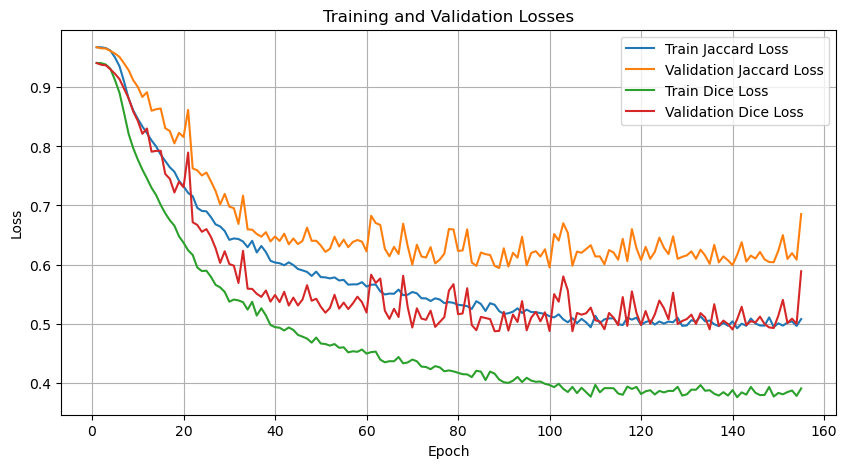

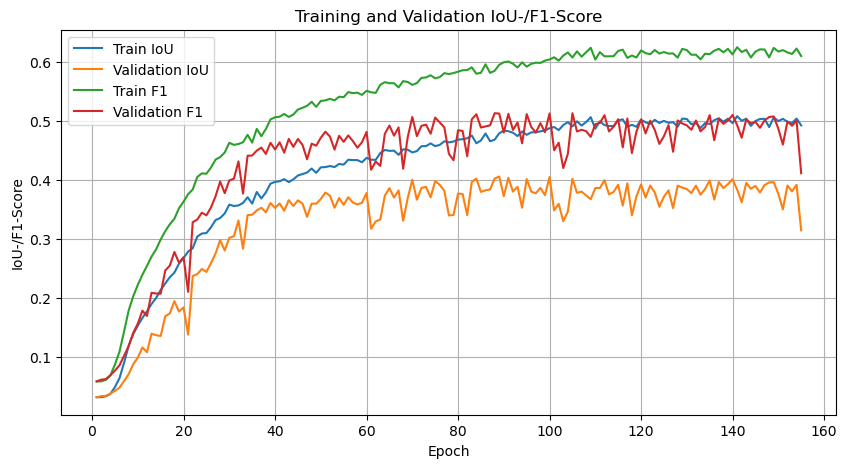

In [24]:
log_file = f"{MODEL_NAME}_training.log"
data = pd.read_csv(log_file)

# Plot Losses (training and validation)
plt.figure(figsize=(10, 5))
plt.plot(data["epoch"], data["train_jaccard_loss"], label="Train Jaccard Loss")
plt.plot(data["epoch"], data["val_jaccard_loss"], label="Validation Jaccard Loss")
plt.plot(data["epoch"], data["train_dice_loss"], label="Train Dice Loss")
plt.plot(data["epoch"], data["val_dice_loss"], label="Validation Dice Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Losses")
plt.legend()
plt.grid(True)
plt.show()

# Plot Score (training and validation)
plt.figure(figsize=(10, 5))
plt.plot(data["epoch"], data["train_iou"], label="Train IoU")
plt.plot(data["epoch"], data["val_iou"], label="Validation IoU")
plt.plot(data["epoch"], data["train_f1"], label="Train F1")
plt.plot(data["epoch"], data["val_f1"], label="Validation F1")
plt.xlabel("Epoch")
plt.ylabel("IoU-/F1-Score")
plt.title("Training and Validation IoU-/F1-Score")
plt.legend()
plt.grid(True)
plt.show()

In [25]:
data[["train_iou", "val_iou", "train_f1", "val_f1"]].agg(["min", "max", "mean"])

,train_iou,val_iou,train_f1,val_f1
min,0.032052,0.032050,0.058685,0.058905
max,0.507912,0.405821,0.624662,0.512975
mean,0.413682,0.329075,0.521434,0.427074


In [26]:
bestmodel = SegFormer(model_type=MODEL, shvit_type=SHVIT_TYPE, input_shape=(1, DEPTH, HEIGHT, WIDTH), num_convs=N_CONVS, num_stages=N_STAGES, num_classes=N_CLASSES, use_center_att=USE_CENTER_ATT, use_resize=USE_RESIZE)

checkpoint = torch.load(f"seg_model_{MODEL_NAME}.pkl", map_location=torch.device("cuda"))  # or map to device if needed
print(checkpoint.keys())
bestmodel.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

bestmodel = fabric.setup(bestmodel) # Move the model to the appropriate device (GPU if available)

test_gen = DataGenerator(filenames=extracted_filenames, folder_path=valid_folder, augment=False)
test_dataloader = DataLoader(test_gen, batch_size=1, shuffle=False)
test_dataloader = fabric.setup_dataloaders(test_dataloader)

/tmp/ipykernel_18145/2123234223.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(f"seg_model_{MODEL_NAME}.pkl", map_location=torch.device("cuda"))

dict_keys(['epoch', 'model_state_dict', 'optimizer_state_dict', 'loss'])


F1:  0.4217601716518402 [0.9860412  0.04925857 0.76989824 0.4344447  0.59654486 0.09933071
 0.01680302]
IoU:  0.34217000007629395 [0.97246677 0.02540305 0.62592787 0.27764246 0.42513594 0.05307585
 0.01553807]
Adidas_Martin-weiss.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


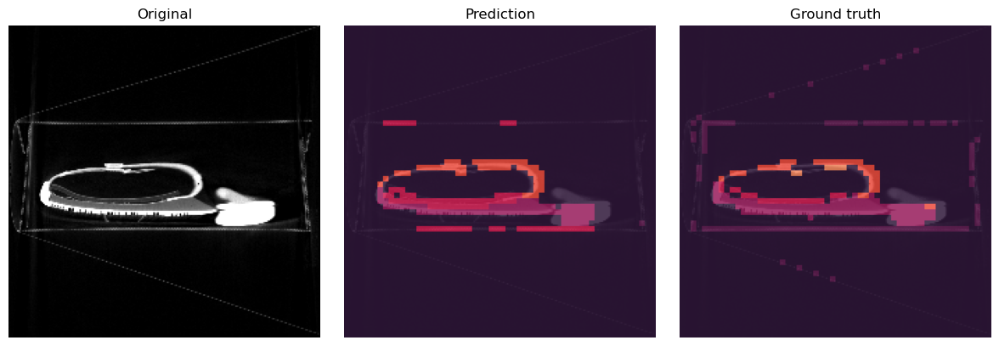

F1:  0.3582145571708679 [0.9779331  0.01547564 0.62175244 0.44487077 0.42926386 0.01496186
 0.00324432]
IoU:  0.2837292551994324 [0.95681924 0.00792348 0.4512395  0.28627548 0.2734201  0.00816696
 0.00225992]
Adidas_Martin.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


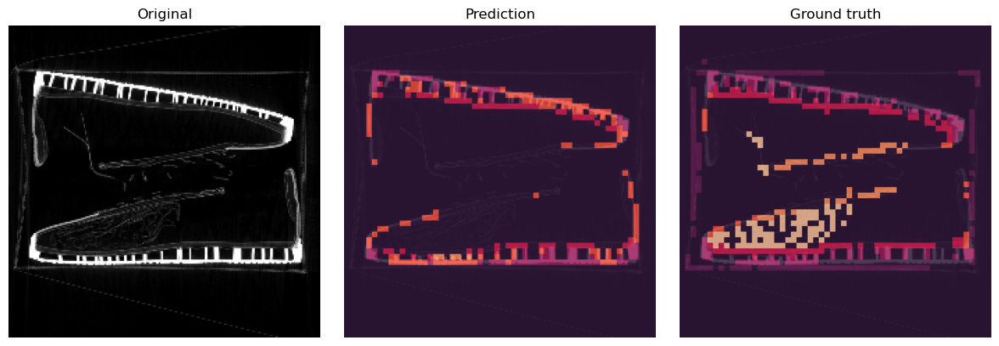

F1:  0.5377784371376038 [0.9580116  0.536308   0.78335494 0.5375367  0.5852332  0.23545407
 0.12855054]
IoU:  0.4163326621055603 [0.9194075  0.3664406  0.6438786  0.36761814 0.41369745 0.1342223
 0.06906393]
Bruschi_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


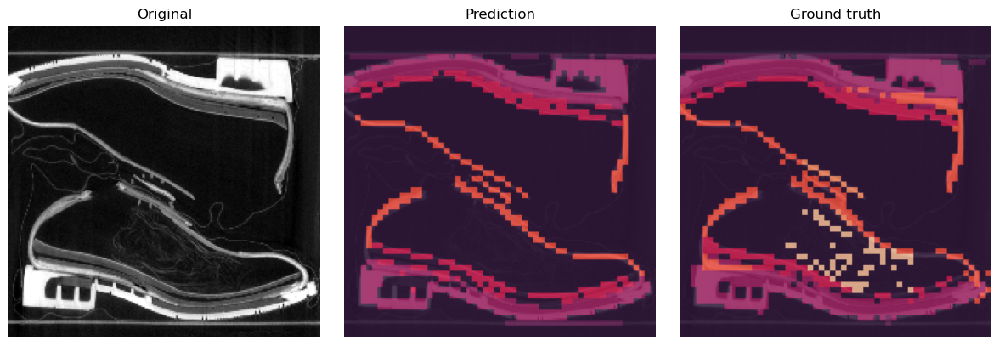

F1:  0.5635479688644409 [0.9283664  0.5522956  0.86315554 0.5382143  0.5435559  0.5177816
 0.00146618]
IoU:  0.4427799880504608 [0.86631    0.38151315 0.75926447 0.36823487 0.37324437 0.34942675
 0.00146618]
Camper_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


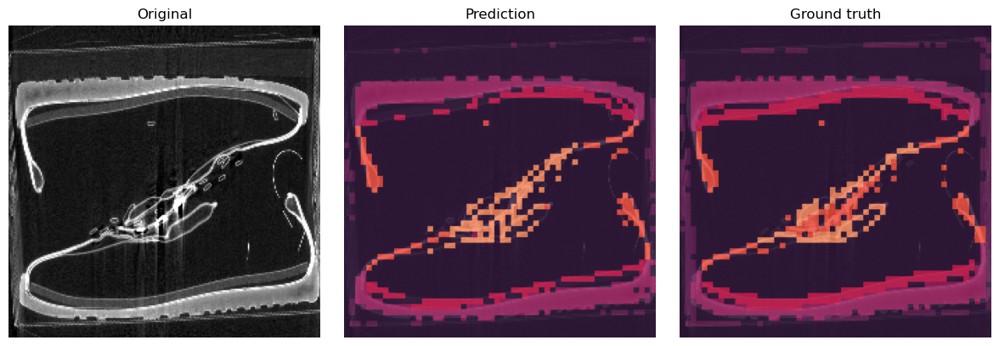

F1:  0.46226412057876587 [9.8617500e-01 4.5979029e-01 7.7980429e-01 4.8257989e-01 5.2480340e-01
 1.7958203e-03 9.0028130e-04]
IoU:  0.36963924765586853 [9.7272718e-01 2.9861718e-01 6.3918692e-01 3.1836936e-01 3.5587817e-01
 1.7958203e-03 9.0028130e-04]
Citywalk-sit-taupe-34_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


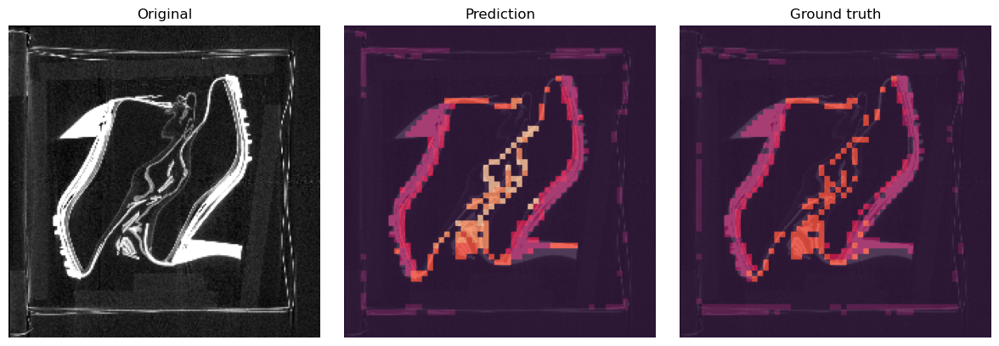

F1:  0.40417036414146423 [0.8094103  0.20809156 0.8181009  0.4782013  0.4948646  0.00241263
 0.01811112]
IoU:  0.30620571970939636 [0.6798407  0.1162766  0.6922734  0.31454125 0.3289478  0.00241263
 0.00914759]
Citywalk-sit-taupe-36_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


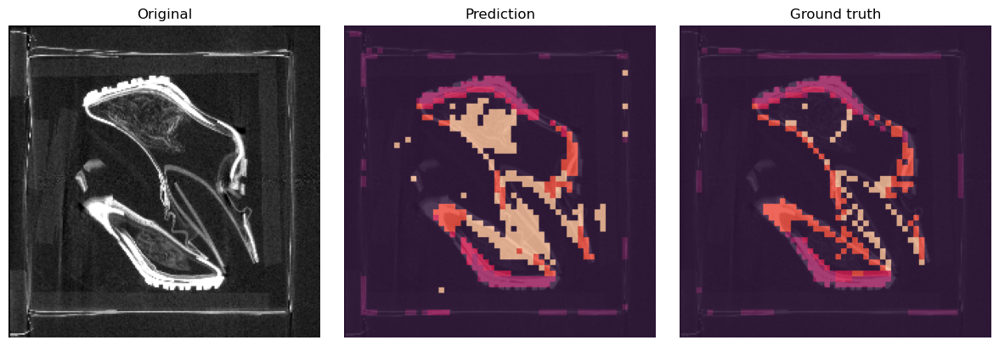

F1:  0.505264163017273 [0.97884285 0.56643665 0.80156076 0.50012374 0.51837486 0.00332142
 0.1681892 ]
IoU:  0.4002315402030945 [0.9585625  0.39520478 0.66892105 0.33370623 0.34999225 0.00332142
 0.09191266]
Citywalk-sit-taupe-39_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


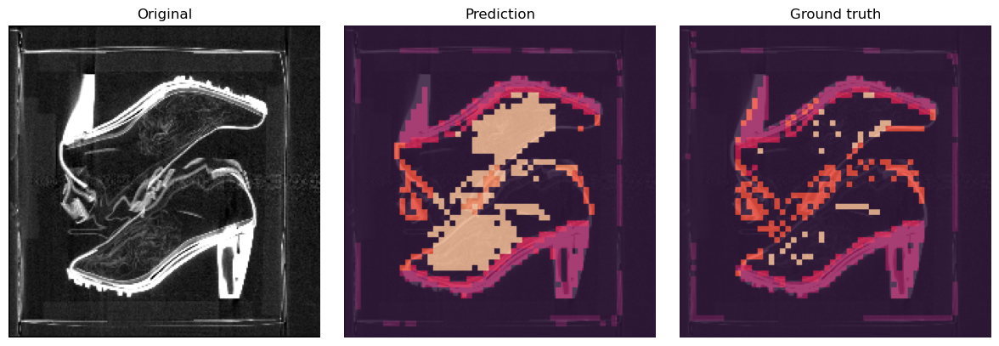

F1:  0.4502098262310028 [0.980562   0.4029504  0.75023633 0.37855548 0.41588724 0.0016027
 0.22167474]
IoU:  0.3482179641723633 [0.9618653  0.25244504 0.6004148  0.23377341 0.262681   0.0016027
 0.12474354]
Citywalk-sit-taupe-40_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


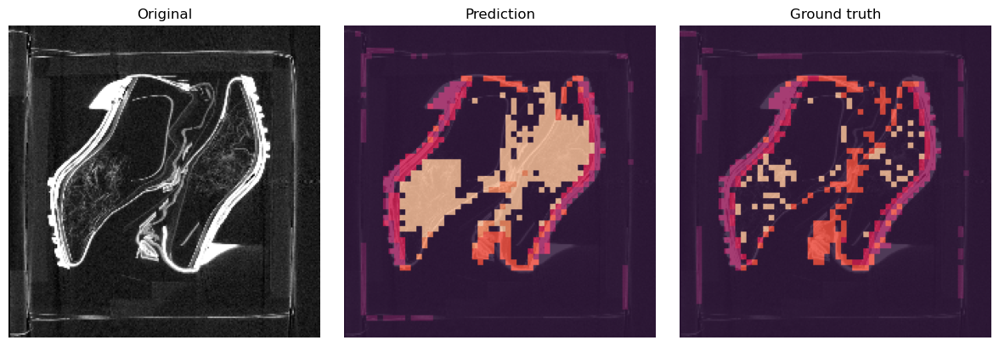

F1:  0.5142237544059753 [0.9846848  0.5817711  0.728943   0.42492044 0.53297436 0.00180306
 0.3444697 ]
IoU:  0.39960959553718567 [0.9698318  0.41029575 0.5735996  0.27011314 0.36340687 0.00180306
 0.20821694]
Citywalk-sit-taupe-42_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


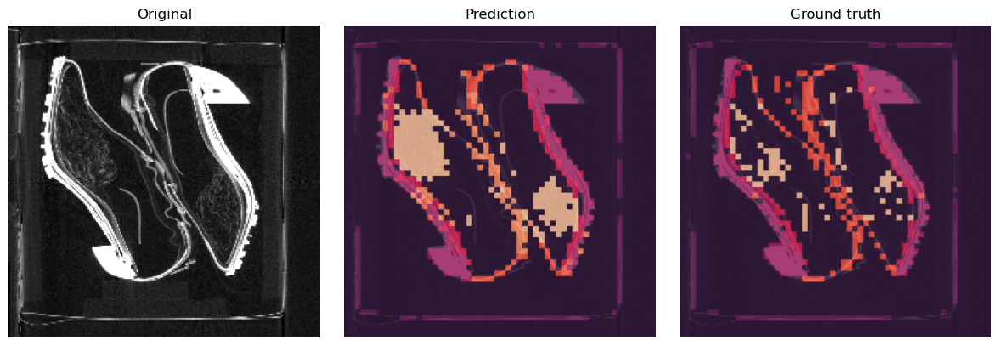

F1:  0.4951459765434265 [0.9590714  0.57375324 0.80465066 0.43705052 0.58152187 0.10780758
 0.00216619]
IoU:  0.3923047184944153 [0.9213616  0.40230846 0.6731675  0.279705   0.40999892 0.05789206
 0.00169943]
Herrenschuh_43p5_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


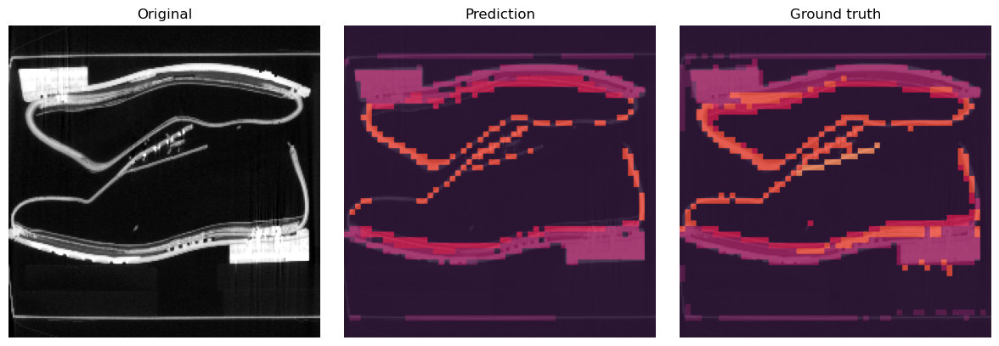

F1:  0.4788193106651306 [0.94467854 0.69822174 0.8042178  0.36513337 0.45975527 0.0657391
 0.01398946]
IoU:  0.3820532262325287 [0.8951575  0.5363798  0.6725569  0.22339006 0.29852304 0.03437606
 0.01398946]
Lidl_43_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


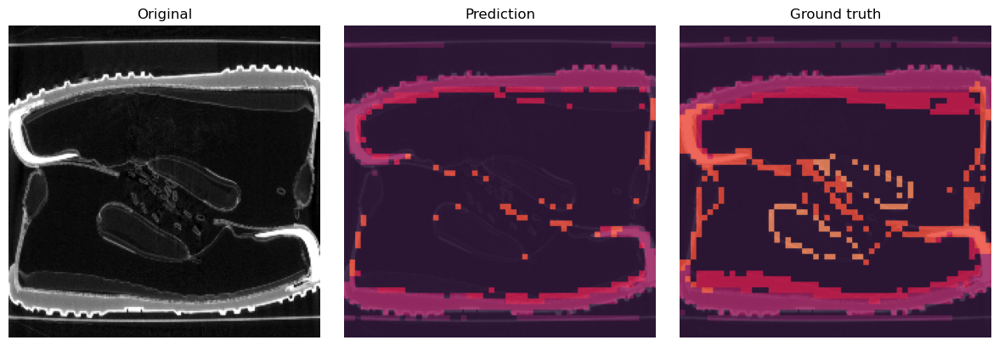

F1:  0.5159569978713989 [0.9497656  0.5650009  0.694959   0.61751086 0.5255568  0.21356201
 0.04534394]
IoU:  0.39678338170051575 [0.90433717 0.39375627 0.5325363  0.4467024  0.3564873  0.11985007
 0.0238141 ]
Lloyd_38_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


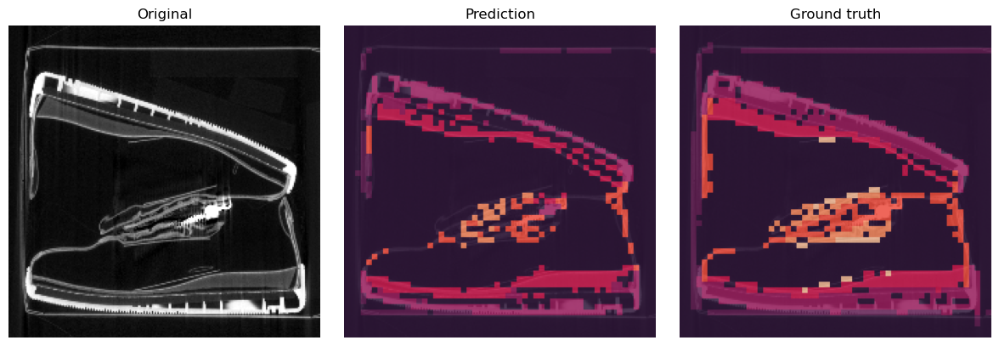

F1:  0.5071852207183838 [0.96058756 0.643013   0.7768584  0.4119659  0.5473442  0.19083571
 0.019692  ]
IoU:  0.3992711901664734 [0.92416424 0.47388116 0.6351439  0.25947833 0.37682322 0.10571534
 0.019692  ]
Lloyd_pink_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


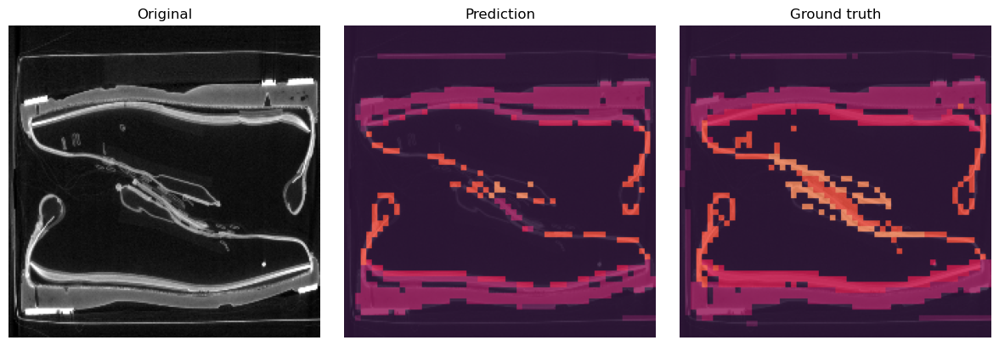

F1:  0.4716147780418396 [0.9390668  0.52312243 0.76734054 0.49289694 0.43115866 0.1304776
 0.01724001]
IoU:  0.36329907178878784 [0.8851333  0.35424095 0.6225207  0.32709238 0.2748581  0.07002208
 0.00922581]
Lloyd_weiss_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


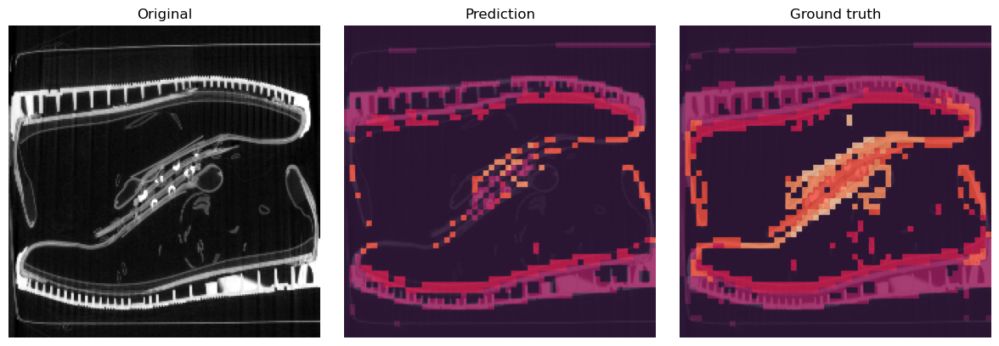

F1:  0.4682958126068115 [0.9652896  0.10236728 0.84291166 0.4427366  0.62013817 0.2527738
 0.05185354]
IoU:  0.3744826018810272 [0.9329082  0.05400825 0.7285023  0.28446397 0.44947568 0.14518526
 0.02683473]
McKinley_Anton_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


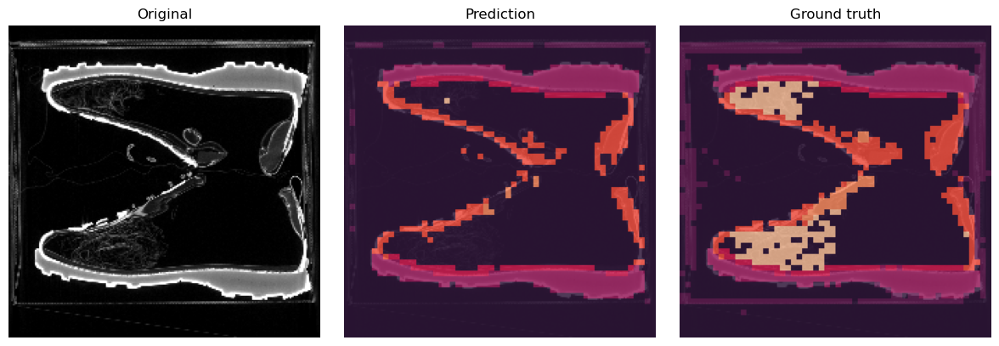

F1:  0.5300057530403137 [0.94316906 0.38958335 0.8064471  0.606523   0.558914   0.3825601
 0.02284366]
IoU:  0.41172319650650024 [0.8924505  0.24202156 0.6757446  0.4354832  0.3879518  0.23682399
 0.01158679]
Mustang-Sch-Navy-Metalli-35_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


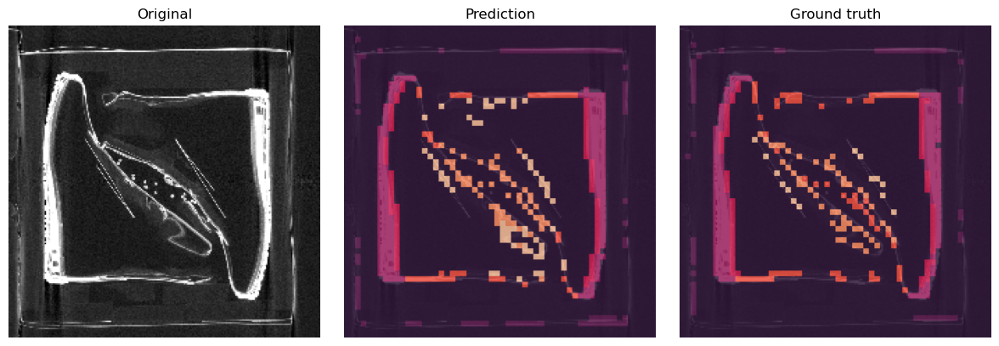

F1:  0.5537537336349487 [0.9845667  0.39087254 0.77937174 0.5975386  0.57049984 0.38198814
 0.17143832]
IoU:  0.4296014606952667 [0.9696026  0.24304484 0.63858056 0.42628443 0.39919093 0.23645711
 0.09405   ]
Mustang-Sch-Navy-Metalli-40_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


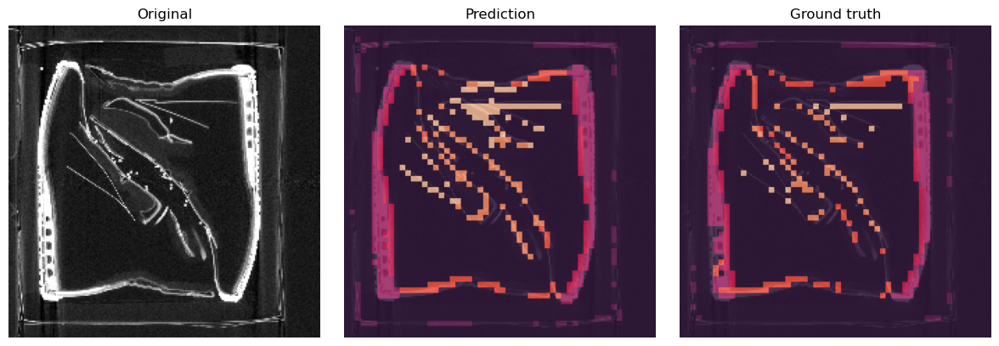

F1:  0.5608404278755188 [0.9813455  0.49149814 0.7725339  0.4682912  0.61616856 0.49926576
 0.09677994]
IoU:  0.4363567531108856 [0.9633743  0.32588953 0.62949324 0.3059981  0.44537947 0.33310226
 0.05126046]
Mustang-Sch-Navy-Metalli_31_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


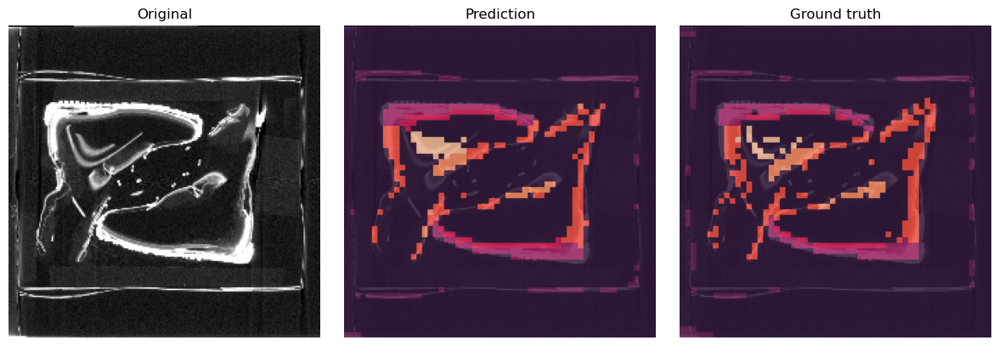

F1:  0.5899291038513184 [0.98054284 0.46885422 0.77672523 0.5927918  0.6085038  0.51040953
 0.19167611]
IoU:  0.4588167667388916 [0.9618285  0.30627188 0.63504446 0.42147082 0.43737596 0.34294203
 0.10678387]
Mustang-Sch-Navy-Metalli_36_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


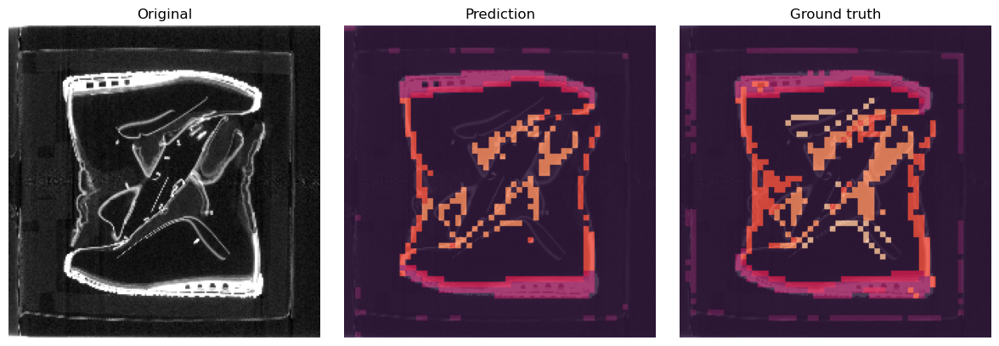

F1:  0.5667983293533325 [0.9816909  0.46063235 0.78171617 0.55962825 0.5818903  0.4639533
 0.13807735]
IoU:  0.4401712417602539 [0.9640403  0.29930574 0.64173675 0.3887385  0.41041568 0.30232266
 0.07463898]
Mustang-Sch-Navy-Metalli_37_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


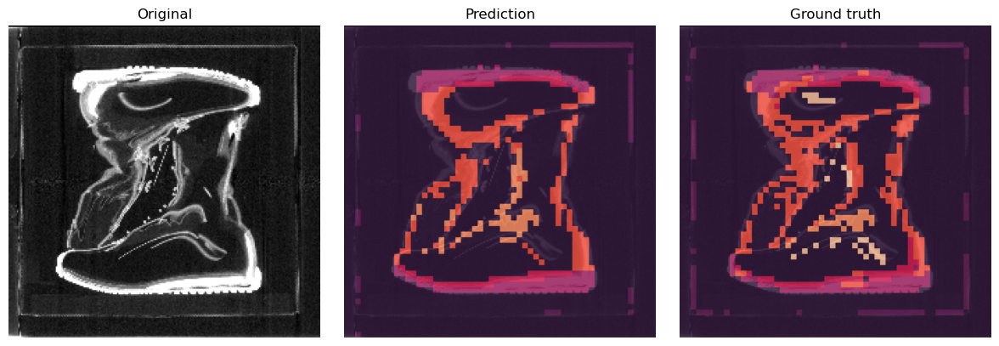

F1:  0.6031613945960999 [0.9661211  0.5104134  0.8522893  0.6960856  0.6799852  0.45823562
 0.05899942]
IoU:  0.4853895604610443 [0.93446267 0.34275272 0.7426492  0.53405046 0.5152613  0.29810277
 0.03044814]
Pertolio-dunkelbraun_43_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


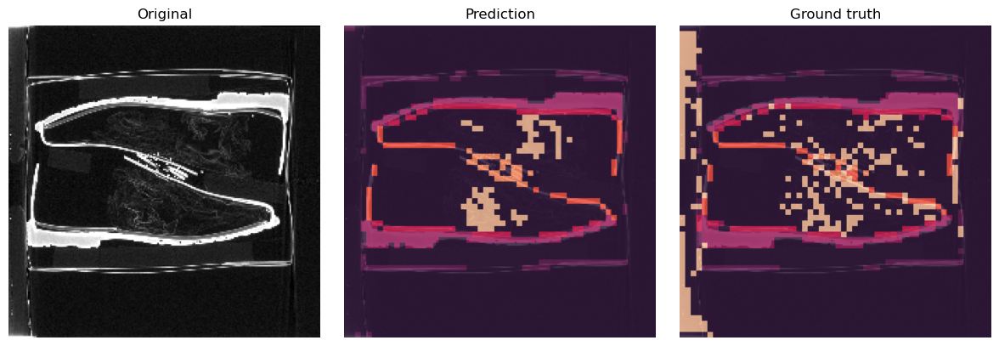

F1:  0.6099112629890442 [0.9826386  0.62396526 0.82208306 0.5357759  0.55858105 0.33753204
 0.40880263]
IoU:  0.47599348425865173 [0.96586984 0.4535067  0.6979678  0.36616036 0.38769975 0.20370696
 0.25704294]
Petrolio-Sch-dunkelbraun_42_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


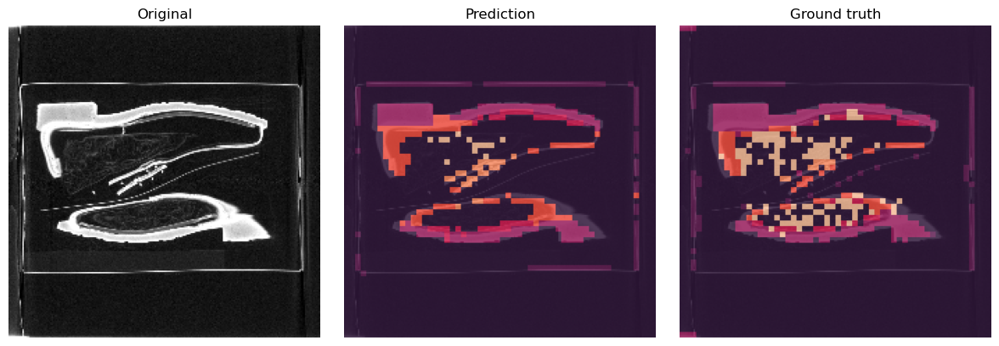

F1:  0.638526439666748 [0.9842419  0.64299834 0.8594728  0.6264747  0.6305031  0.45084098
 0.27515313]
IoU:  0.5092612504959106 [0.96897286 0.47389024 0.75361955 0.4563379  0.46053508 0.29176173
 0.1597116 ]
Petrolio-Sch-dunkelbraun_44_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


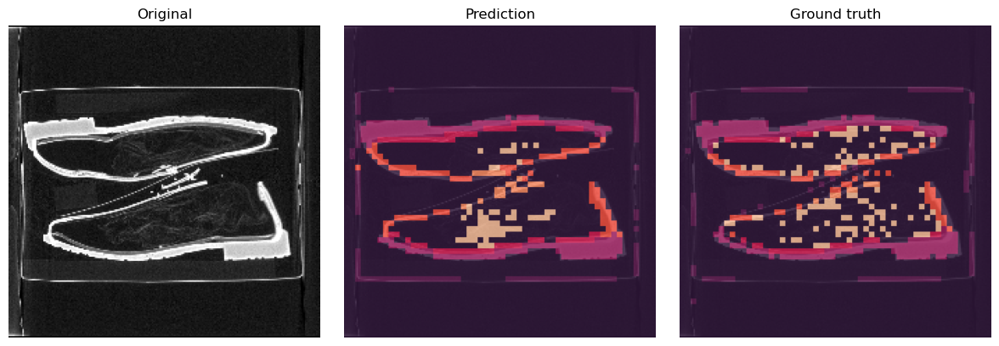

F1:  0.6414562463760376 [0.98312247 0.59649444 0.8334583  0.63822824 0.65627086 0.41079426
 0.371825  ]
IoU:  0.5073640942573547 [0.9668053  0.42507866 0.71451527 0.46885884 0.48849803 0.25930303
 0.2284893 ]
Petrolio-Sch-dunkelbraun_46_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


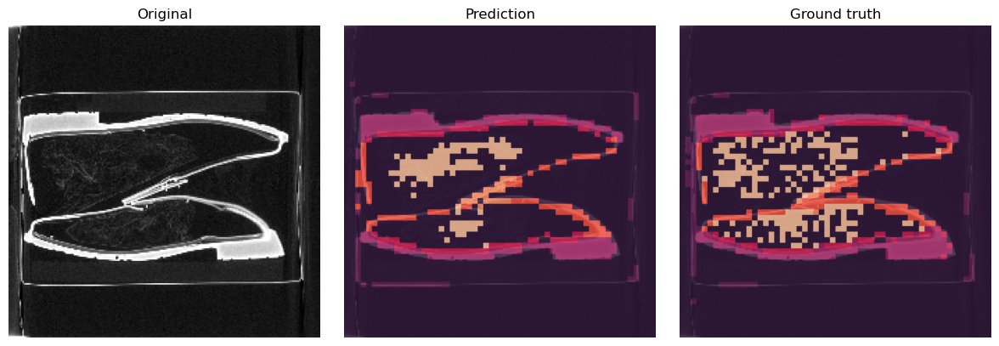

F1:  0.624617874622345 [0.9615195  0.59449255 0.84041446 0.5562579  0.5851262  0.37588185
 0.4586326 ]
IoU:  0.48605039715766907 [0.9258909  0.42300195 0.724775   0.38540342 0.41361168 0.23207238
 0.29759738]
PetrolioSch-40-float_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


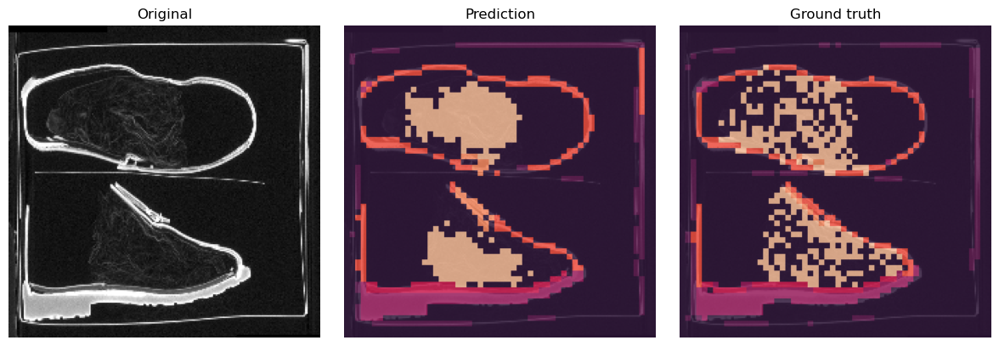

F1:  0.4787280559539795 [0.9031097 0.4364867 0.6064778 0.3607721 0.5468326 0.4924865 0.0049311]
IoU:  0.35201123356819153 [0.823337   0.27919355 0.43522474 0.22013977 0.37633902 0.32683378
 0.00301098]
Puma_38_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


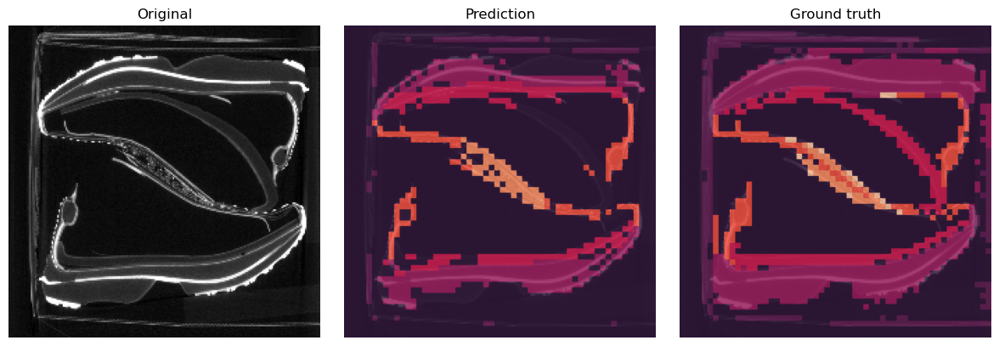

F1:  0.46697553992271423 [0.92224926 0.43467978 0.51001334 0.5314571  0.5003165  0.36192146
 0.00819146]
IoU:  0.34294965863227844 [0.85571706 0.2777206  0.34231466 0.3619398  0.33365607 0.22110812
 0.00819146]
Puma_Silver_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


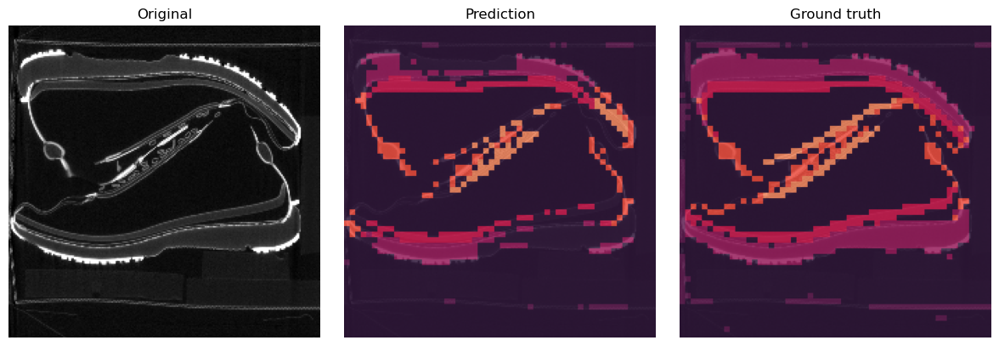

F1:  0.5951653718948364 [0.9244804  0.4660377  0.7561352  0.57817256 0.48675945 0.40224266
 0.5523297 ]
IoU:  0.447603702545166 [0.85956675 0.30383745 0.60790247 0.40668342 0.32173184 0.2519249
 0.3815789 ]
Puma_White_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


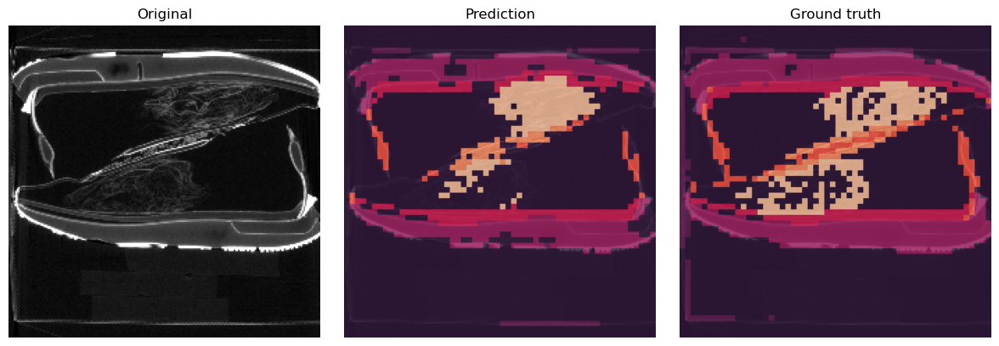

F1:  0.43047067523002625 [0.9788044  0.01953455 0.7478796  0.45491755 0.62052566 0.1904698
 0.00116291]
IoU:  0.3454766869544983 [9.58488762e-01 1.00024845e-02 5.97339392e-01 2.94631392e-01
 4.49940741e-01 1.07119955e-01 8.14021332e-04]
Schuh_Martin_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


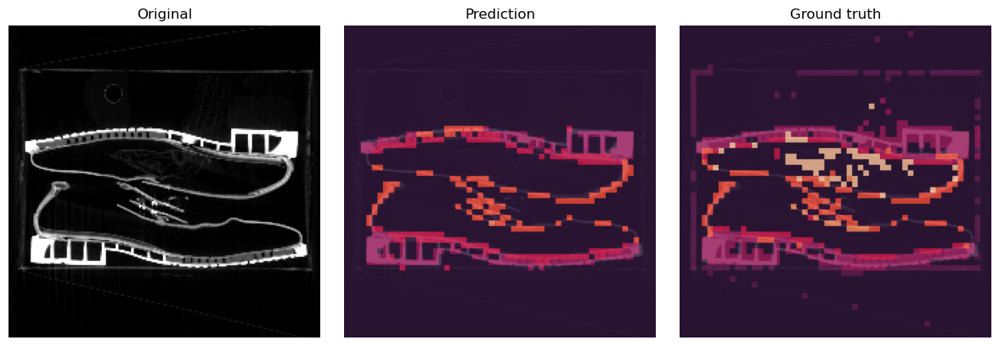

F1:  0.592775821685791 [0.9371591  0.7616218  0.7955029  0.60120153 0.5934405  0.4525713
 0.0079337 ]
IoU:  0.4722599387168884 [0.8817496  0.6150316  0.6604539  0.42985725 0.4219494  0.29274526
 0.00403249]
Shoepassion_40_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


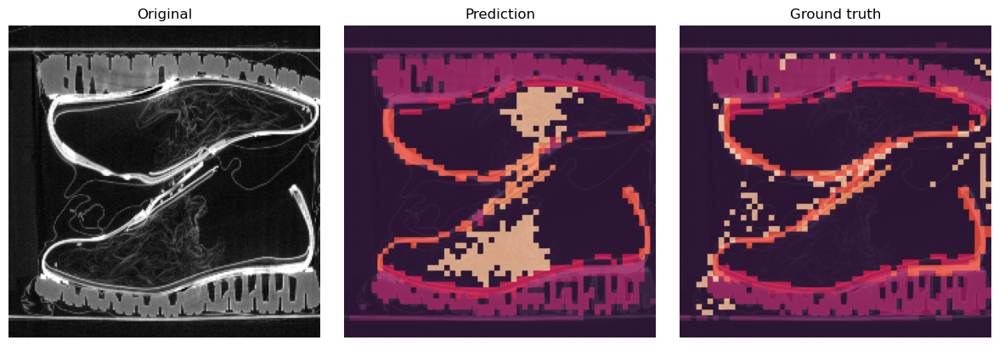

F1:  0.5510462522506714 [0.9387623  0.7442883  0.8242909  0.6515346  0.6846275  0.00980198
 0.00401811]
IoU:  0.45629024505615234 [0.88459235 0.5927398  0.70111036 0.48320156 0.520505   0.00980198
 0.00208053]
Shoepassion_45_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


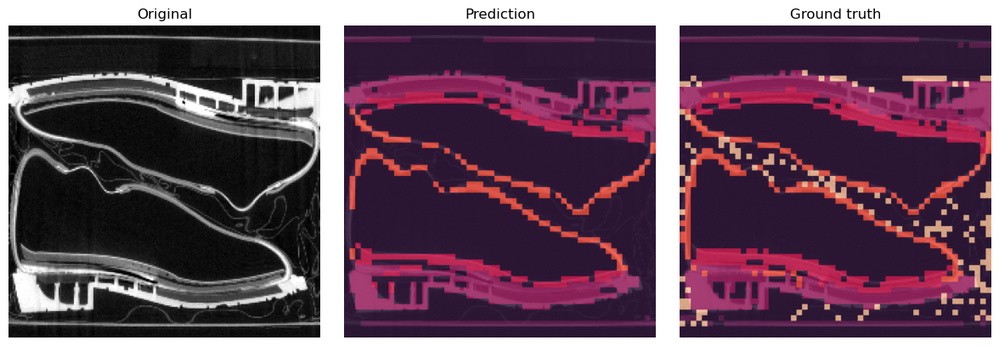

F1:  0.5579205751419067 [0.97016543 0.6719482  0.8339362  0.49032697 0.62981915 0.00866337
 0.3005847 ]
IoU:  0.44765418767929077 [0.9420597  0.5059884  0.7151883  0.32488796 0.459709   0.00866337
 0.17708248]
Shoepassion_Herren_40_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


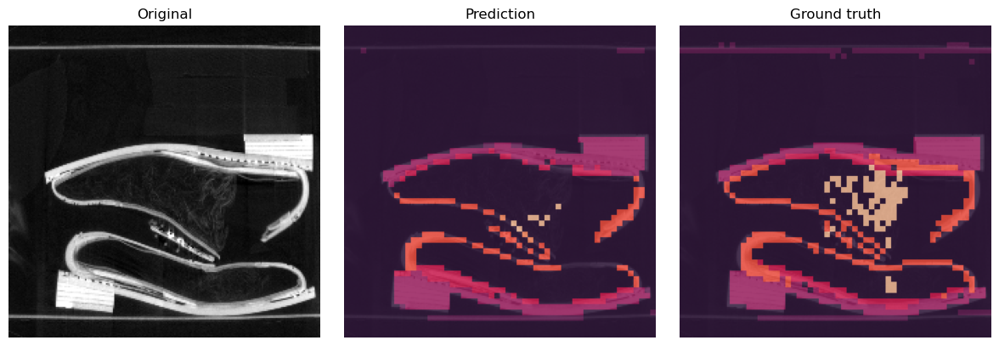

F1:  0.5377488732337952 [0.9573615  0.35326982 0.88801247 0.6327611  0.6305418  0.27058226
 0.03171352]
IoU:  0.4347434937953949 [0.9182107  0.21456294 0.79858893 0.4628593  0.46046665 0.15680237
 0.03171352]
Sneaker_Dana_Nike.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


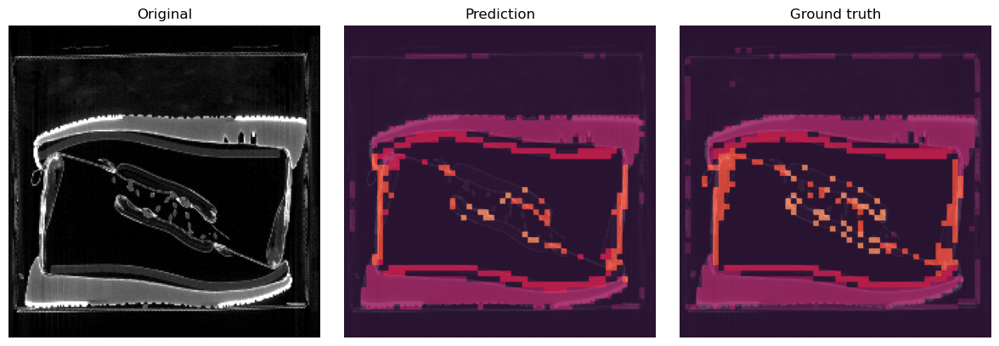

F1:  0.4481959640979767 [0.94407684 0.13170432 0.7924039  0.52295965 0.494364   0.21878561
 0.03307741]
IoU:  0.35134822130203247 [0.8940776  0.07052988 0.6561944  0.3541077  0.32838386 0.12306692
 0.03307741]
Sneaker_Dana_Puma_Flyer.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


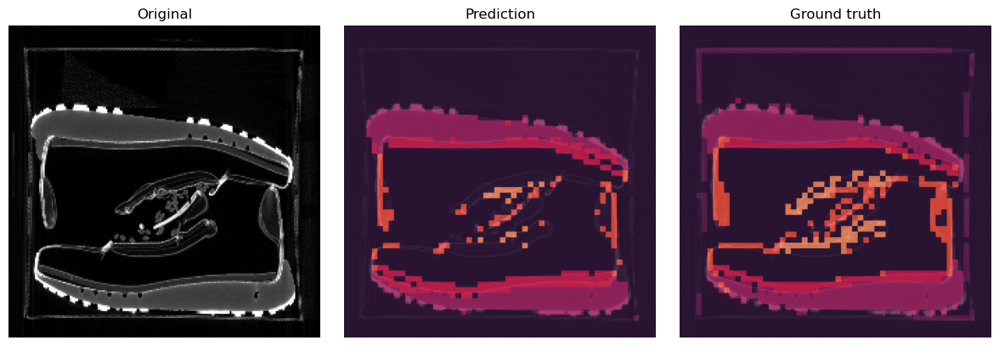

F1:  0.4131341874599457 [9.6985430e-01 2.4118501e-01 7.1193999e-01 3.9825240e-01 4.5377302e-01
 1.1601143e-01 9.2304277e-04]
IoU:  0.31955626606941223 [9.4147307e-01 1.3720863e-01 5.5278713e-01 2.4888590e-01 2.9355577e-01
 6.2060494e-02 9.2304277e-04]
Stiefel-XY_40_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


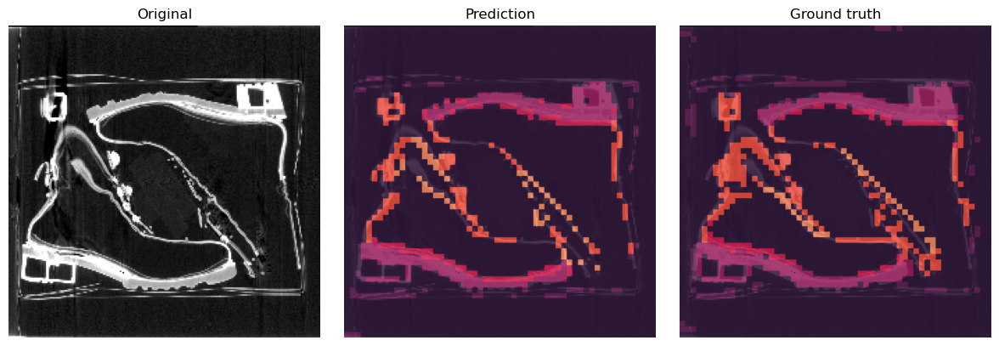

F1:  0.49995678663253784 [0.98447025 0.4653404  0.70821583 0.4265058  0.4932995  0.01336843
 0.40849724]
IoU:  0.3843924105167389 [0.96941555 0.30329734 0.5484079  0.2714496  0.32777706 0.01336843
 0.25703079]
Tamaris-Pump-Schwarz-38_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


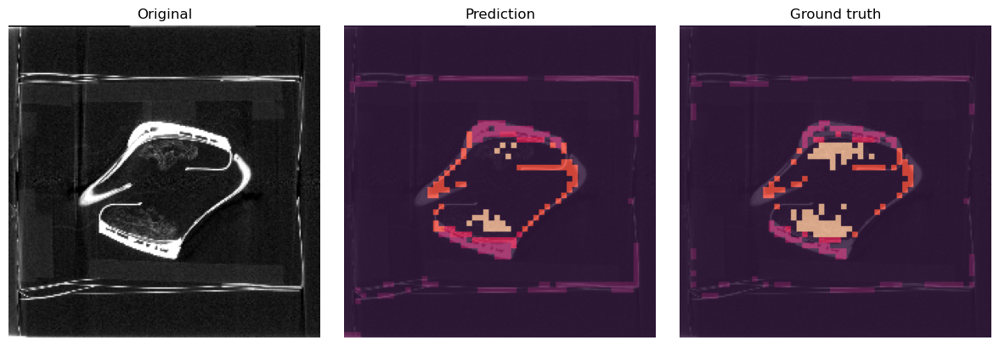

F1:  0.50107741355896 [0.9896487  0.5461312  0.8153354  0.39238912 0.5526138  0.00780231
 0.20362157]
IoU:  0.39882901310920715 [0.9795096  0.3757538  0.68833005 0.2444584  0.38211405 0.00780231
 0.11383502]
Tamaris-Pump-schwarz_36_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


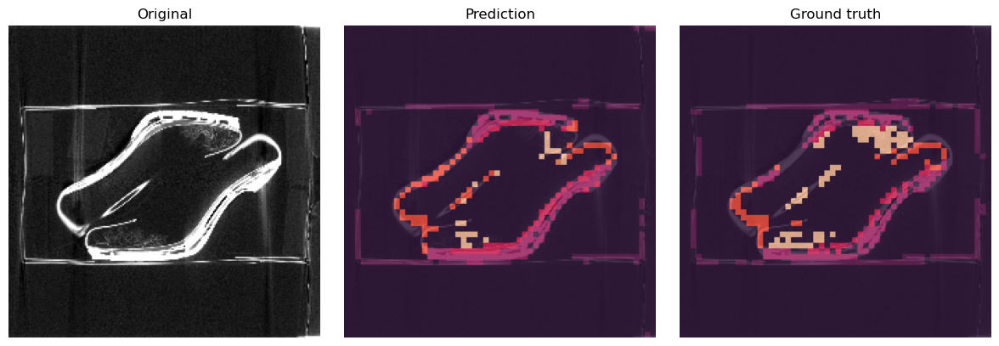

F1:  0.4051031768321991 [0.871069   0.3134505  0.7854923  0.41329592 0.43667024 0.00287819
 0.01286597]
IoU:  0.3077395260334015 [0.7715881  0.18592475 0.64684385 0.26081553 0.27963722 0.00287819
 0.00648905]
Tamaris-Pump-Schwarz_39_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


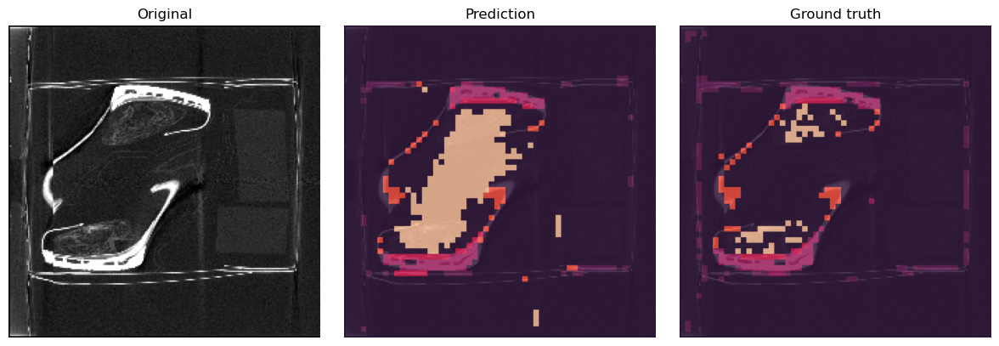

F1:  0.4746570885181427 [0.9885008  0.4420318  0.74326634 0.37792546 0.48775306 0.02681592
 0.25630635]
IoU:  0.3690579831600189 [0.97726303 0.2838229  0.5915364  0.23346663 0.3228425  0.02681592
 0.14765872]
Tamaris-Pump-schwarz_40_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


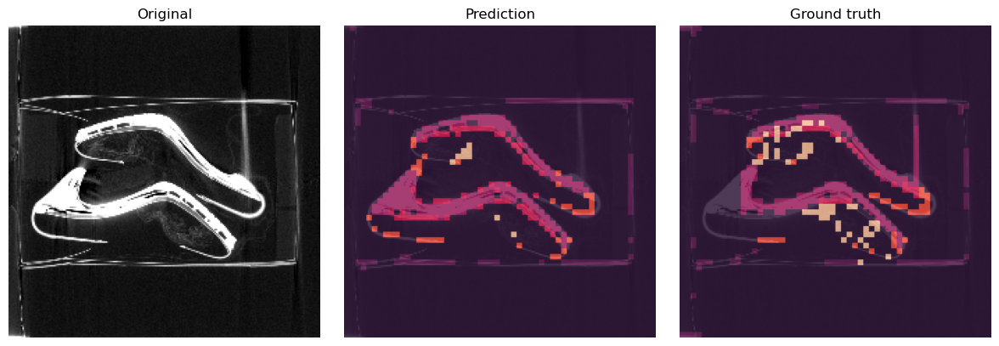

F1:  0.49260830879211426 [0.9858078  0.36522198 0.818458   0.53120786 0.57454646 0.0207683
 0.15224776]
IoU:  0.39390483498573303 [0.9720128  0.22349925 0.6927828  0.36202756 0.4033225  0.0207683
 0.08292039]
Tamaris-Pump-schwarz_42_down2_2_2.npy
(224, 224, 224) (56, 56, 56) (7, 56, 56, 56)


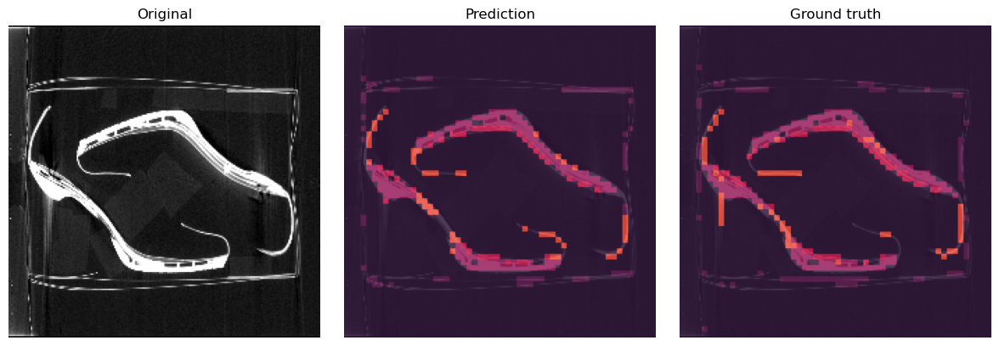

In [27]:
avg_iou_scores = []
iou_class_scores = []

avg_f1_scores = []
f1_class_scores = []

test_iter = iter(test_dataloader)

for i in range(40):
    vol, seg, filename = next(test_iter)
    
    bestmodel.eval()
    with torch.no_grad():
        pred = bestmodel(vol)#.cpu().detach().numpy()
    
    avg, f1 = f1_score_metric(seg.cpu(), pred.cpu(), smooth=1, num_classes=N_CLASSES)
    print("F1: ", avg.item(), torch.stack(f1).cpu().numpy())
    avg_f1_scores.append(avg.item())  # scalar float
    f1_class_scores.append(torch.stack(f1).cpu().numpy())  # numpy array per sample    

    avg, iou = iou_metric(seg.cpu(), pred.cpu(), smooth=1, num_classes=N_CLASSES)
    print("IoU: ", avg.item(), torch.stack(iou).cpu().numpy())
    avg_iou_scores.append(avg.item())  # scalar float
    iou_class_scores.append(torch.stack(iou).cpu().numpy())  # numpy array per sample    
    

    vol = vol[0].squeeze(0).cpu().detach().numpy()
    seg = seg[0].squeeze(0).cpu().detach().numpy()
    pred = pred.cpu().detach().numpy()

    print(str(filename[0]))
    print(vol.shape, seg.shape, pred[0].shape)
    
    image = vol[vol.shape[0]//2,:,:]
    H, W = image.shape[0], image.shape[1]    
    seg = seg[seg.shape[0]//2,:,:]


    pred = np.argmax(pred[0], axis=0)
    pred = pred[pred.shape[0]//2,:,:]
  
    seg = cv2.resize(seg, (W, H), interpolation=cv2.INTER_NEAREST) # i.e. StiefelXY: original image and masks have different sizes (968x1130) vs (971x1101) ...
    pred = cv2.resize(pred, (W, H), interpolation=cv2.INTER_NEAREST) # i.e. StiefelXY: original image and masks have different sizes (968x1130) vs (971x1101) ...
    
    seg = torch.from_numpy(seg).unsqueeze(0)
    pred = torch.from_numpy(pred).unsqueeze(0)

    _s = give_color_to_seg_img(seg).permute(1, 2, 0).numpy()
    _p = give_color_to_seg_img(pred).permute(1, 2, 0).numpy()
    
    # Convert tensors to numpy arrays for visualization
    image = image
    predimg = cv2.addWeighted(np.stack([image]*3, axis=-1), 0.15, _p, 0.85, 0)
    trueimg = cv2.addWeighted(np.stack([image]*3, axis=-1), 0.15, _s, 0.85, 0)
    
    plt.figure(figsize=(12, 4))
    plt.subplot(131)
    plt.title("Original")
    plt.imshow(image, cmap="gray")
    plt.axis("off")
    
    plt.subplot(132)
    plt.title("Prediction")
    plt.imshow(predimg)
    plt.axis("off")
    
    plt.subplot(133)
    plt.title("Ground truth")
    plt.imshow(trueimg)
    plt.axis("off")
    plt.tight_layout()
    # plt.savefig("pred_"+str(i)+".png", dpi=150)
    plt.show()
    
    
# Average overall IoU/F1
avg_iou_overall = sum(avg_iou_scores) / len(avg_iou_scores)
avg_f1_overall = sum(avg_f1_scores) / len(avg_f1_scores)

# Average per-class IoU/F1
iou_class_scores_np = np.stack(iou_class_scores)  # shape: [num_samples, num_classes]
avg_iou_per_class = np.mean(iou_class_scores_np, axis=0)    
std_iou_per_class = np.std(iou_class_scores_np, axis=0)
f1_class_scores_np = np.stack(f1_class_scores)  # shape: [num_samples, num_classes]
avg_f1_per_class = np.mean(f1_class_scores_np, axis=0)    
std_f1_per_class = np.std(f1_class_scores_np, axis=0)

In [32]:
print(class_dict)

print(f"Average Overall IoU Score: {avg_iou_overall:.4f}")
# print(f"Average Per-Class IoU Scores: {["{:.4f}".format(x) for x in avg_iou_per_class]}")
# print(f"Standard-Deviation Per-Class IoU Scores: {["{:.4f}".format(x) for x in std_iou_per_class]}")

print(f"Average Overall F1 Score: {avg_f1_overall:.4f}")
# print(f"Average Per-Class F1 Scores: {["{:.4f}".format(x) for x in avg_f1_per_class]}")
# print(f"Standard-Deviation Per-Class F1 Scores: {["{:.4f}".format(x) for x in std_f1_per_class]}")

{'Background': 0, 'Karton': 1, 'Außensohle': 2, 'Innensohle': 3, 'Obermaterial': 4, 'Zunge': 5, 'Füllmaterial': 6}
Average Overall IoU Score: 0.4020
Average Overall F1 Score: 0.5130
